# Processo seletivo datarisk
### Notebook do Case - Modelo preditivo para aprovação de crédito

## 1. Introdução


### 1.1 Contexto e descrição do problema do projeto

Modelos de score de crédito calculam a probabilidade de inadimplência e são uma das
principais ferramentas utilizadas por diversas empresas para aprovar ou negar um
crédito.
O objetivo deste desafio é criar um modelo preditivo calculando a probabilidade de
inadimplência de cada novo pedido de crédito.



### 1.2 Descrição do conjunto de dados

Cada linha representa um cliente e as colunas representam os dados (informações) desses
clientes.
A variável resposta é a coluna inadimplente, que indica se o tomador veio a se tornar
inadimplente(1) ou não(0).
As variáveis da base de dados são descritas abaixo:

    - idade: A idade do cliente..
    - numero_de_dependentes: O número de pessoas dependentes do cliente.
    - salario_mensal: Salário mensal do cliente.
    - numero_emprestimos_imobiliarios: Quantidade de empréstimos imobiliários que o cliente possui em aberto.
    - numero_vezes_passou_90_dias: Número de vezes que o tomador passou mais de 90 dias em atraso.
    - util_linhas_inseguras: Quanto que o cliente está usando, relativamente ao limite dele, de linhas de crédito que não são seguradas por qualquer bem do tomador e.g: imoveis, carros etc.
    - vezes_passou_de_30_59_dias: Número de vezes que o cliente atrasou, entre 30 e 59 dias, o pagamento de um empréstimo.
    - razao_debito: Razão entre as dívidas e o patrimônio do tomador. razão débito = Dividas/Patrimônio
    - numero_linhas_crdto_aberto: Número de empréstimos em aberto pelo cliente.
    - numero_de_vezes_que_passou_60_89_dias: Número de vezes que o cliente atrasou, entre 60 e 89 dias, o pagamento de um empréstimo.

Obs: Estes dados foram retirados de terceiros, portanto é possível que existam
incoerências, o que é perfeitamente comum em dados reais.



### 1.3 Visão geral da metodologia

Neste projeto, a metodologia CRISP (Cross-Industry Standard Process) foi adotada para projetos de mineração e análise de dados. A metodologia CRISP é uma estrutura amplamente utilizada que fornece uma abordagem estruturada para orientar um projeto do início ao fim. Ela consiste de seis fases principais, a saber, Compreensão do Negócio, Compreensão de Dados, Preparação de Dados, Modelagem, Avaliação e Implantação.

A metodologia foi escolhida devido à sua natureza cíclica, o que permite a melhoria contínua do projeto. O processo cíclico significa que após a fase de implantação, os resultados do projeto são revisados, e melhorias podem ser feitas em iterações futuras. Além disso, a metodologia proporciona uma abordagem sistemática e rigorosa do projeto de ciência dos dados, assegurando que as metas e objetivos sejam alcançados de forma estruturada e eficiente.

A metodologia foi adaptada para se adequar às necessidades específicas do projeto. Embora a fase de implantação seja uma parte crítica da metodologia CRISP, foi decidido deixá-la fora do escopo deste projeto. Portanto, o foco será nas cinco primeiras fases da metodologia CRISP, que são Compreensão do Negócio, Compreensão de Dados, Preparação de Dados, Modelagem e Avaliação.


### 1.4 Bibliotecas utilizadas

In [25]:
# Importando as bibliotecas necessárias

%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

# Bibliotecas de pré-processamento de dados
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.pipeline import Pipeline
from imblearn.pipeline import make_pipeline
from imblearn.pipeline import Pipeline as imbPipeline
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler, NearMiss
from imblearn.combine import SMOTEENN
from sklearn.preprocessing import RobustScaler, Binarizer
from feature_engine.transformation import YeoJohnsonTransformer
from feature_engine.outliers import Winsorizer
from sklearn.base import BaseEstimator, TransformerMixin
from feature_engine.wrappers import SklearnTransformerWrapper

# Bibliotecas de análise exploratória de dados
from ydata_profiling import ProfileReport
import missingno

# Bibliotecas de avaliação de modelos
from sklearn.model_selection import train_test_split, cross_val_score, learning_curve, StratifiedKFold
from sklearn.metrics import plot_confusion_matrix, ConfusionMatrixDisplay, classification_report, precision_recall_curve, auc, plot_precision_recall_curve, plot_roc_curve, roc_auc_score, average_precision_score
from imblearn.metrics import classification_report_imbalanced

# Bibliotecas de algoritmos de aprendizado de máquina
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.svm import SVC

# Bibliotecas de otimização de hiperparâmetros
import optuna
from optuna.samplers import TPESampler
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer, fbeta_score
import ghostml

# Outras
import datetime
import pickle

## 2. Compreensão e exploração dos dados

### 2.1 Carregamento dos dados


In [26]:
treino = pd.read_csv('treino.csv')
teste = pd.read_csv('teste.csv')

### 2.2 Framework de validação


In [27]:
def split_data(treino, rand=None):
    # Crie as matrizes de atributos (X) e objetivo (y) para todo o conjunto de dados
    X = treino.drop('inadimplente', axis=1)
    y = treino.inadimplente

    # Separe o conjunto de dados em conjuntos de treinamento completo e teste com uma taxa de 0,2 e estratificação por "inadimplente"
    X_full_train, X_test, y_full_train, y_test = train_test_split(X, y, test_size=0.2, random_state=rand, stratify=y)

    # Divida ainda mais o conjunto de treinamento completo em conjuntos de treinamento e validação com uma taxa de 0,25 e estratificação por "inadimplente"
    X_train, X_val, y_train, y_val = train_test_split(X_full_train, y_full_train, test_size=0.25, random_state=rand, stratify=y_full_train)

    # Print do comprimento dos conjuntos de treinamento, validação e teste
    print('Treino:', len(X_train),'Validação:', len(X_val),'Teste:', len(X_test))

    return X_full_train, y_full_train, X_test, y_test, X_train, y_train, X_val, y_val
X_full_train, y_full_train, X_test, y_test, X_train, y_train, X_val, y_val = split_data(treino)

Treino: 66000 Validação: 22000 Teste: 22000


### 2.3 Visualização e análise exploratória dos dados


Nesta seção, será realizada uma análise exploratória de dados (EDA) no conjunto de dados de treinamento usando a biblioteca ydata profiling (antigamente chamada pandas profilling) para obter insights e prepará-los para modelagem. Esta ferramenta poderosa gera relatórios detalhados sobre o conjunto de dados, fornecendo uma maneira rápida de entender a distribuição de valores, identificar valores ausentes ou duplicados e destacar problemas potenciais. Ela também nos ajudará a descobrir padrões e tendências importantes que podem orientar decisões de pré-processamento e modelagem, além de fornecer visualizações e estatísticas resumidas para comunicação das descobertas.

In [28]:
profile = ProfileReport(X_full_train, title="Relatório do conjunto de treinamento")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

A análise dos dados revelou que:
 - As classes estão extremamente desbalanceadas (93.7% vs 6.7%);
 - Dois atributos (salario_mensal e numero_de_dependentes) contém valores nulos ou faltantes;
 - Os atributos vezes_passou_de_30_59_dias, numero_vezes_passou_90_dias, numero_de_vezes_que_passou_60_89_dias e numero_de_dependentes são compostos majoritariamente por zeros;
 - Os histogramas revelam que a maioria dos atributos possuem distribuições extremamente assimétricas.

Dessa forma, é necessário, respectivamente:
- Utilizar estratégias de balanceamento dos dados (atribuição de pesos, undersampling ou oversampling) ou então empregar um modelo de identificação de outliers (isolation forest, por exemplo);
- Tratar os valores nulos, imputando novos valores (média, mediana, moda, ou como algoritmo KNN) e/ou excluindo os atributos/exemplos com valores nulos;
- Considerar transformar atributos com muitos zeros em atributos binários (0 ou maior que 0);
- Excluir/modificar outliers, transformar a escala (log, recíproca, box-cox, etc.) ou escalonar os atributos com distribuições assimétricas.

## 3. Feature Engineering


Nesta etapa, exploraremos as quatro áreas-chave do feature engineering:
- Imputação de valores ausentes;
- Descretização de variáveis binárias;
- Transformações de escalas;
- Tratamento de variáveis com outliers;

Ao final desta seção, teremos limpo e preparado os dados para a modelagem.

In [29]:
# Função para plotar um histograma e um gráfico Q-Q lado a lado para uma determinada variável em um dataframe

def diagnostic_plots(df, variable):
    
    import matplotlib.pyplot as plt
    import scipy.stats as stats
    
    # Cria uma figura com tamanho 15 por 6 polegadas
    plt.figure(figsize=(15, 6))

    # Plota um histograma da variável
    plt.subplot(1, 2, 1)
    df[variable].hist(bins=30)
    plt.title(f"Histograma de {variable}")

    # Plota o gráfico Q-Q da variável
    plt.subplot(1, 2, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.title(f"Gráfico Q-Q de {variable}")

    # Mostra o gráfico
    plt.show()


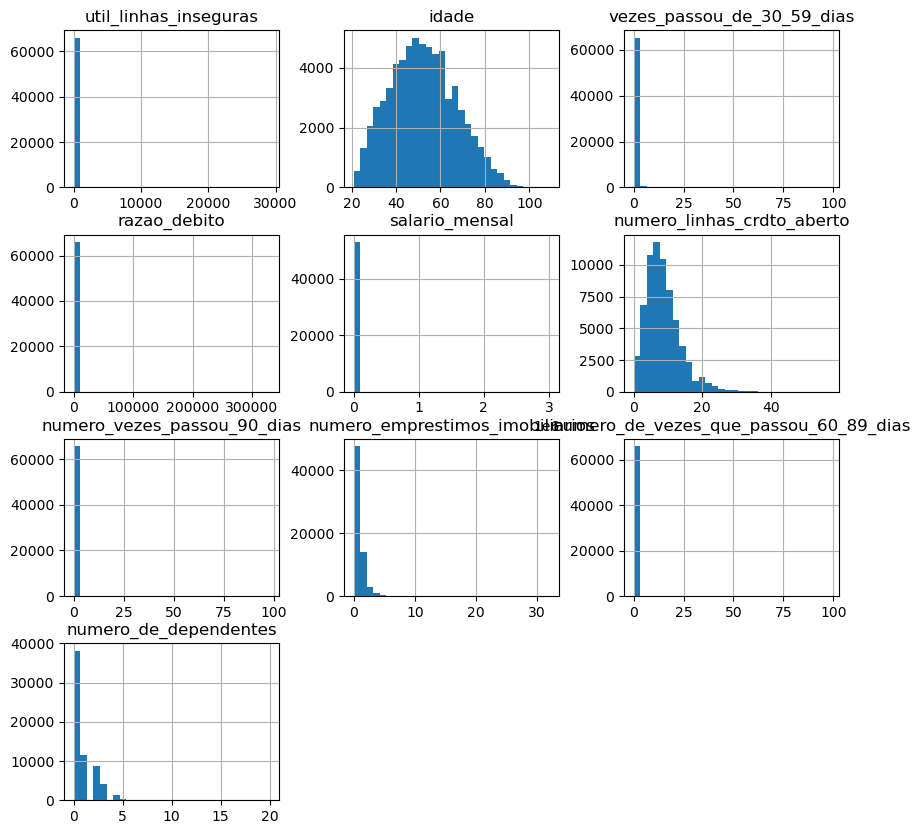

In [30]:
# Plota um histograma para cada variável em X_train (para usar de referência)
X_train.hist(bins=30, figsize=(10, 10), layout=(4, 3));

### 3.1 Variáveis com dados faltantes

In [31]:
# Seleciona as variáveis que possuem valores faltantes
variaveis_com_faltantes = ['salario_mensal', 'numero_de_dependentes']

# Cria um novo DataFrame a partir do conjunto de treinamento
df_faltantes = X_train.copy()

# Cria uma nova coluna "faltantes" que indica se a variável possui valor faltante
df_faltantes.loc[(df_faltantes.salario_mensal.isnull()) | (df_faltantes.numero_de_dependentes.isnull()),'faltantes'] = 1

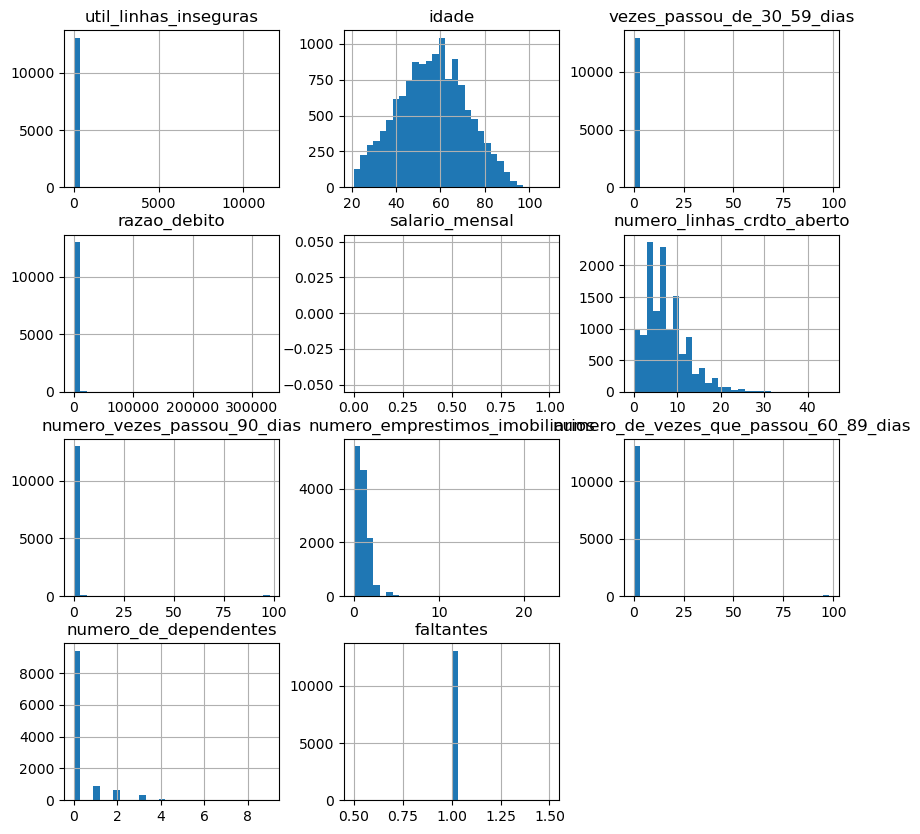

In [32]:
# Plota um histograma para as variáveis com valores faltantes
df_faltantes.query('faltantes == 1').hist(bins=30, figsize=(10, 10), layout=(4, 3));

Os histogramas e a matrix de nulidade indicam que não existe padrão aparente para os dados faltantes, logo podem ser imputados baseando-se nos demais dados.

In [33]:
# Importa o módulo necessário
from sklearn.impute import KNNImputer

# Inicializa o imputer KNN com 2 vizinhos
imputer = KNNImputer(n_neighbors=2)

# Imputa os valores faltantes nos conjuntos de treinamento e teste
X_full_train = pd.DataFrame(imputer.fit_transform(X_full_train), columns=list(X_full_train))
X_train = pd.DataFrame(imputer.fit_transform(X_train), columns=list(X_train))
X_val = pd.DataFrame(imputer.transform(X_val), columns=list(X_val))
X_test = pd.DataFrame(imputer.transform(X_test), columns=list(X_test))

### 3.2 Atributos com maioria dos valores igual a zero: descretização binária

In [34]:
# Define a função para transformar variáveis binárias em 0 e 1
def tranformar_vars_com_zero(df):

    variaveis_binarias = [
    'vezes_passou_de_30_59_dias',
    'numero_vezes_passou_90_dias',
    'numero_de_vezes_que_passou_60_89_dias',
    'numero_de_dependentes'
]
    df_bin = df.copy()

    for var in variaveis_binarias:
        # Aplica a transformação 1 se diferente de zero, 0 caso contrário
        df_bin[var] = df_bin[var].apply(lambda x: 1 if x != 0 else 0)

    return df_bin

# Lista das variáveis binárias a serem transformadas
variaveis_binarias = [
    'vezes_passou_de_30_59_dias',
    'numero_vezes_passou_90_dias',
    'numero_de_vezes_que_passou_60_89_dias',
    'numero_de_dependentes'
]

# Aplica a função de transformação em todos os conjuntos de dados
X_full_train = tranformar_vars_com_zero(X_full_train)
X_train = tranformar_vars_com_zero(X_train)
X_val = tranformar_vars_com_zero(X_val)
X_test = tranformar_vars_com_zero(X_test)

### 3.3 Variáveis em escalas diferentes

salario_mensal


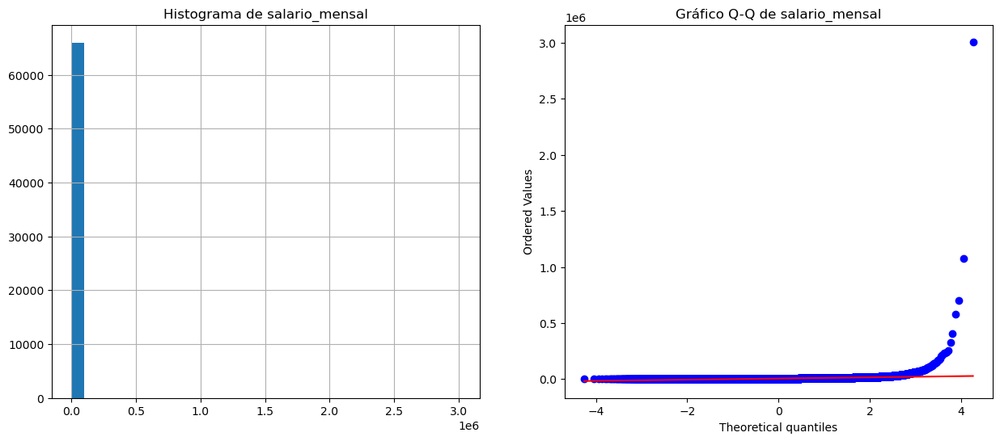

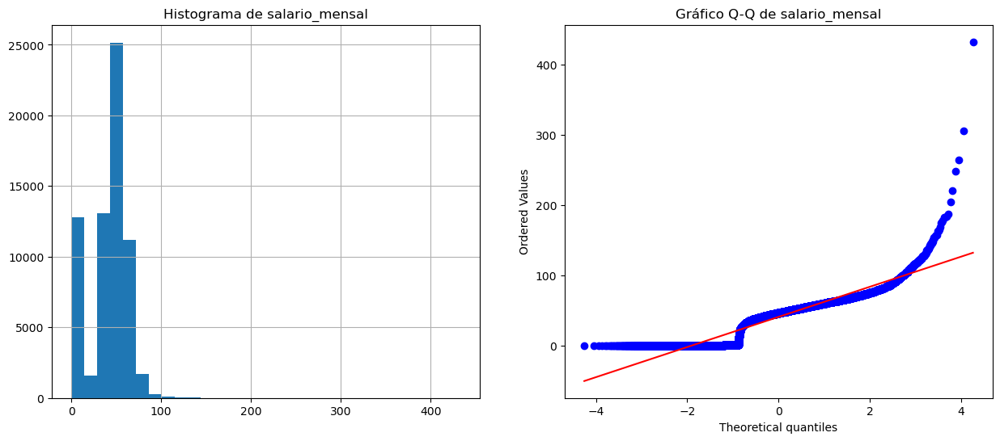


razao_debito


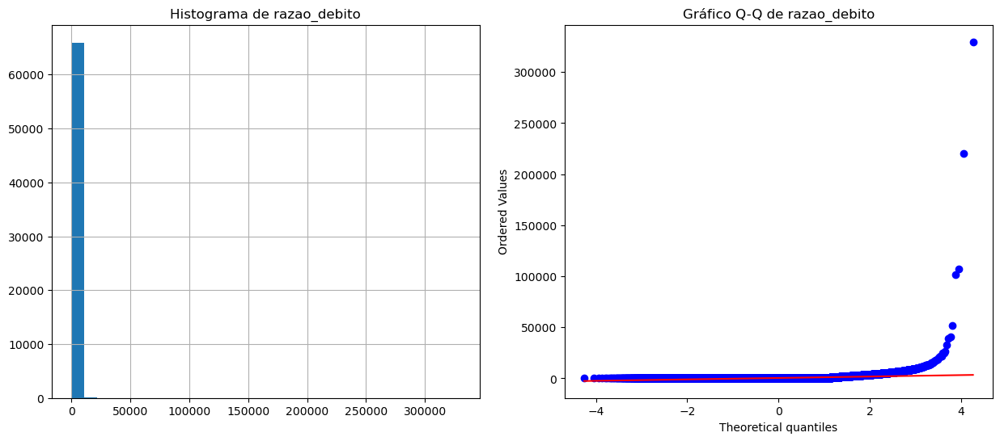

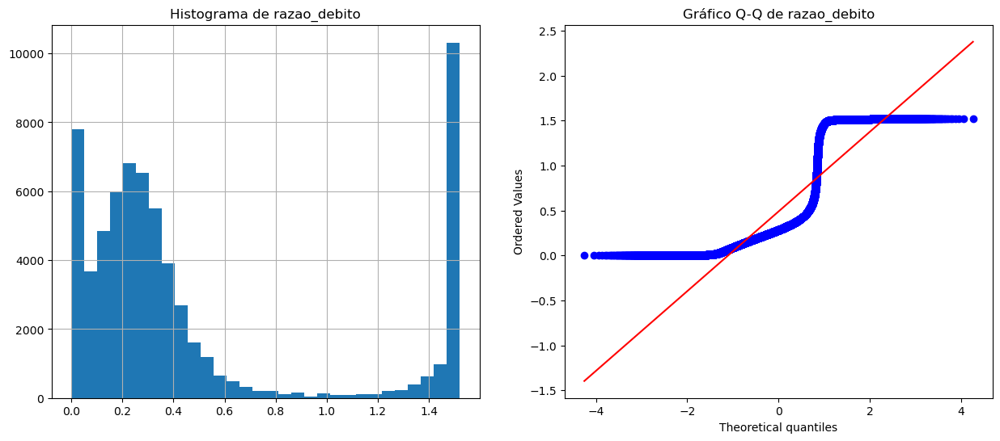


util_linhas_inseguras


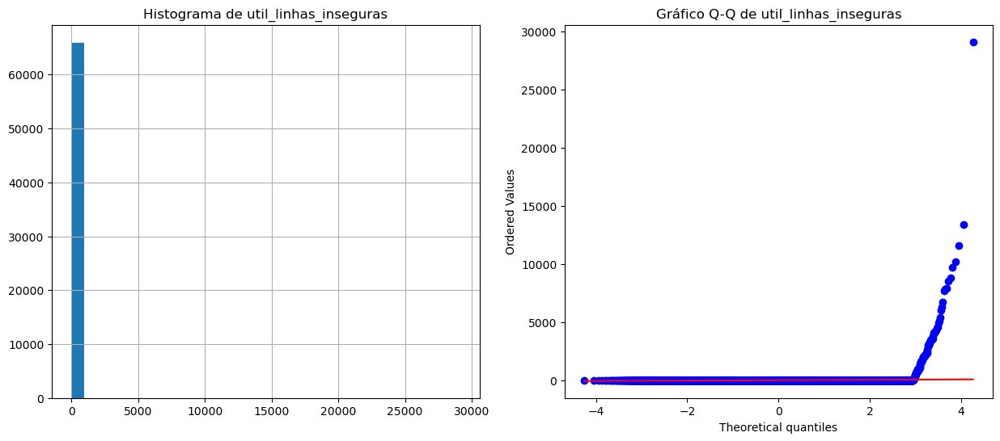

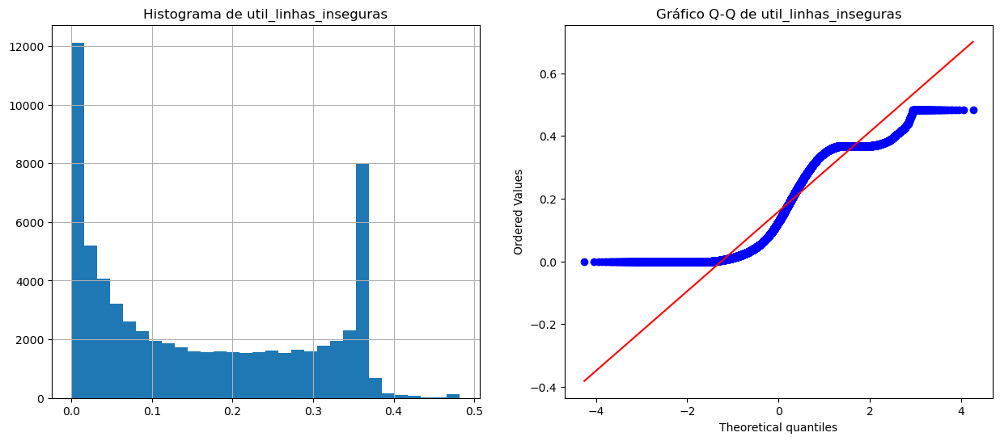

In [35]:
# Lista das variáveis que serão transformadas
variaveis_outras_escalas = [
    'razao_debito',
    'salario_mensal',
    'util_linhas_inseguras'
    ]

# Cria uma instância da classe YeoJohnsonTransformer com as variáveis escolhidas
yeo_transformer = YeoJohnsonTransformer(variables=variaveis_outras_escalas)

# Ajusta a transformação ao conjunto de treinamento
yeo_transformer.fit(X_train)

# Transforma as variáveis do conjunto de treinamento
X_train_tf = yeo_transformer.transform(X_train)

# Cria gráficos de histograma e Q-Q plot antes e depois da transformação para cada variável escolhida
print('salario_mensal')
diagnostic_plots(X_train,'salario_mensal')
diagnostic_plots(X_train_tf,'salario_mensal')

print('\nrazao_debito')
diagnostic_plots(X_train,'razao_debito')
diagnostic_plots(X_train_tf,'razao_debito')

print('\nutil_linhas_inseguras')
diagnostic_plots(X_train,'util_linhas_inseguras')
diagnostic_plots(X_train_tf,'util_linhas_inseguras')


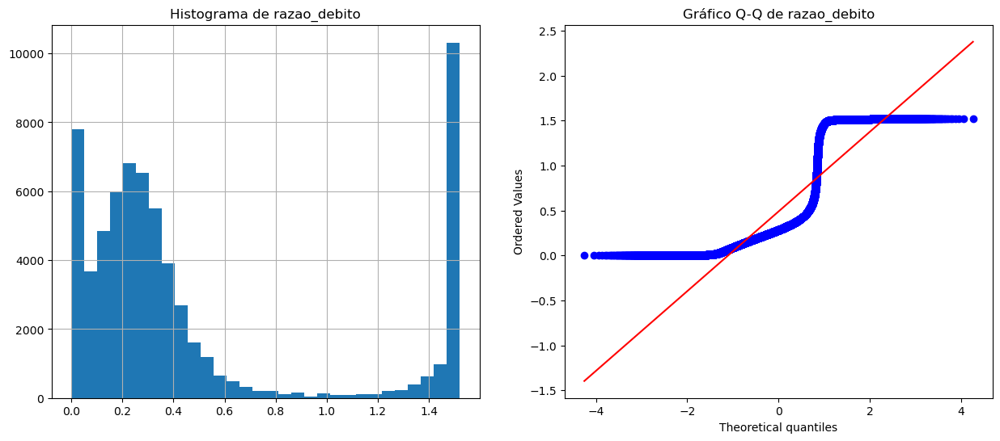

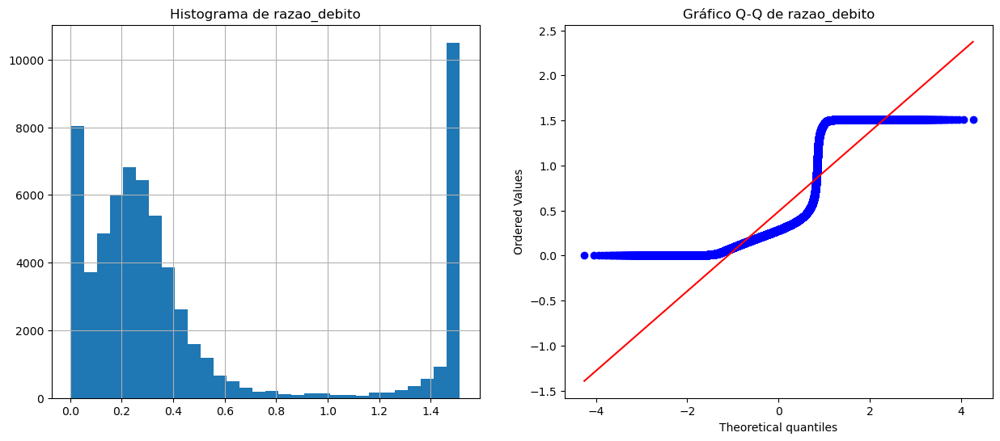

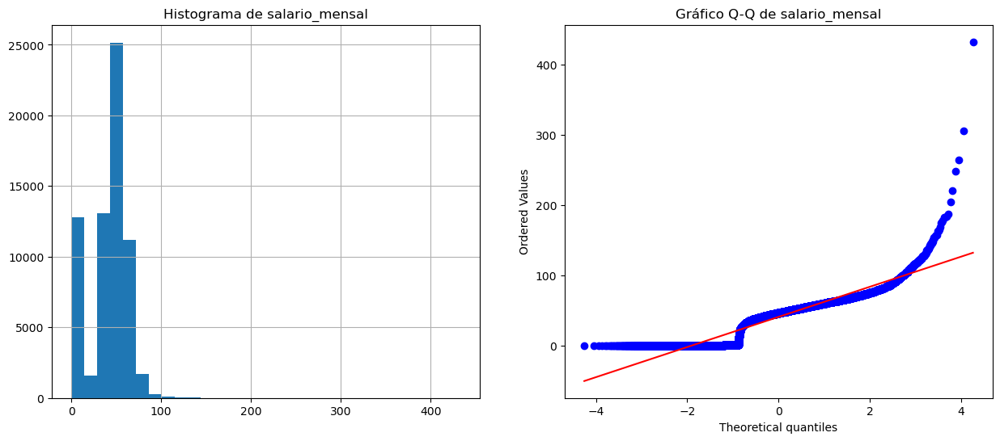

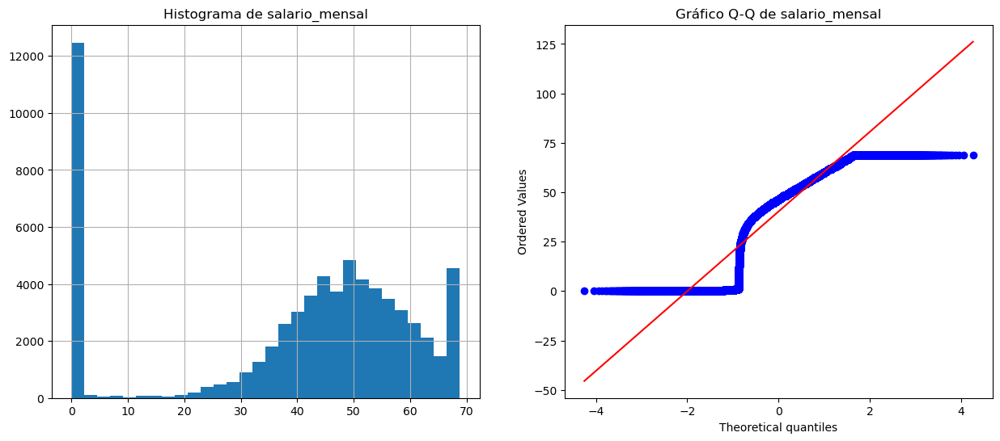

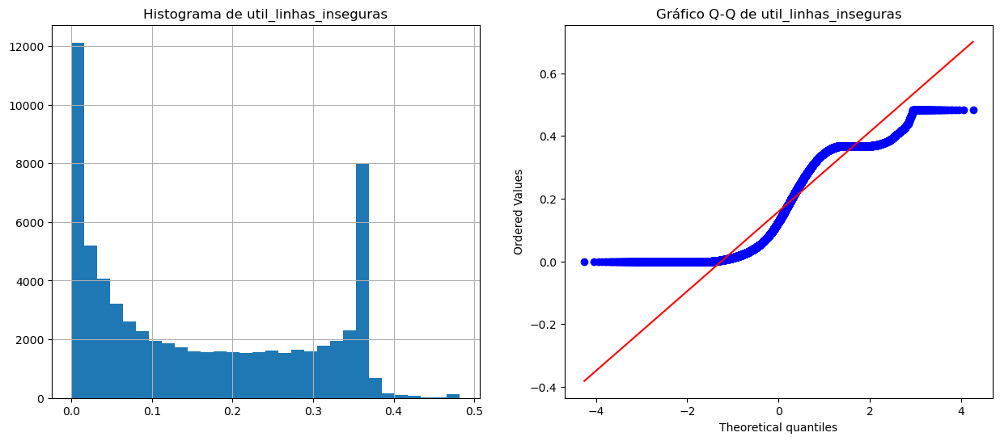

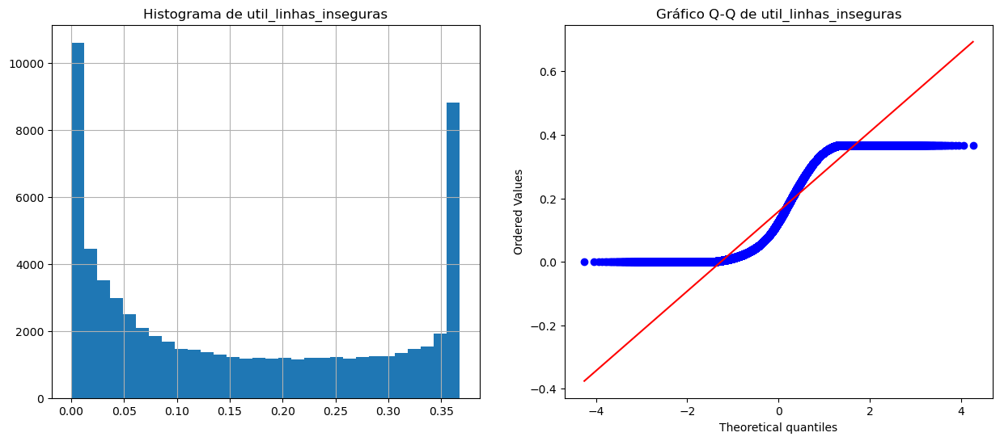

In [36]:
# Importar o módulo necessário
from feature_engine.outliers import Winsorizer

# Criar uma instância do Winsorizer para limitar os valores das variáveis ​​numéricas nos conjuntos de dados
capper = Winsorizer(
    variables=variaveis_outras_escalas,  # as variáveis para limitar
    capping_method="quantiles",  # definir o método de limitação
    tail="both",  # limitar tanto a cauda esquerda quanto a direita
    fold=0.05,  # definir a porcentagem das caudas a serem cortadas
)

# Ajustar o objeto de limitação aos dados de treinamento
capper.fit(X_train_tf)

# Aplicar a limitação aos dados de treinamento
X_train_winsor = capper.transform(X_train_tf)

# Criar gráficos de histograma e Q-Q plot para as variáveis ​​'razao_debito', 'salario_mensal' e 'util_linhas_inseguras' antes e depois da limitação
diagnostic_plots(X_train_tf, 'razao_debito')
diagnostic_plots(X_train_winsor, 'razao_debito')
diagnostic_plots(X_train_tf, 'salario_mensal')
diagnostic_plots(X_train_winsor, 'salario_mensal')
diagnostic_plots(X_train_tf,'util_linhas_inseguras')
diagnostic_plots(X_train_winsor,'util_linhas_inseguras')


df=       util_linhas_inseguras  idade  vezes_passou_de_30_59_dias  razao_debito  \
0                   0.076878   64.0                           0      1.351650   
1                   0.044757   35.0                           0      0.197265   
2                   0.283194   42.0                           0      1.513176   
3                   0.042037   39.0                           0      0.294707   
4                   0.209770   57.0                           0      1.508977   
...                      ...    ...                         ...           ...   
87995               0.075220   72.0                           0      0.197755   
87996               0.098191   50.0                           0      0.227178   
87997               0.352326   67.0                           0      0.234474   
87998               0.130651   41.0                           1      0.254305   
87999               0.061717   54.0                           0      0.322775   

       salario_mensal  n

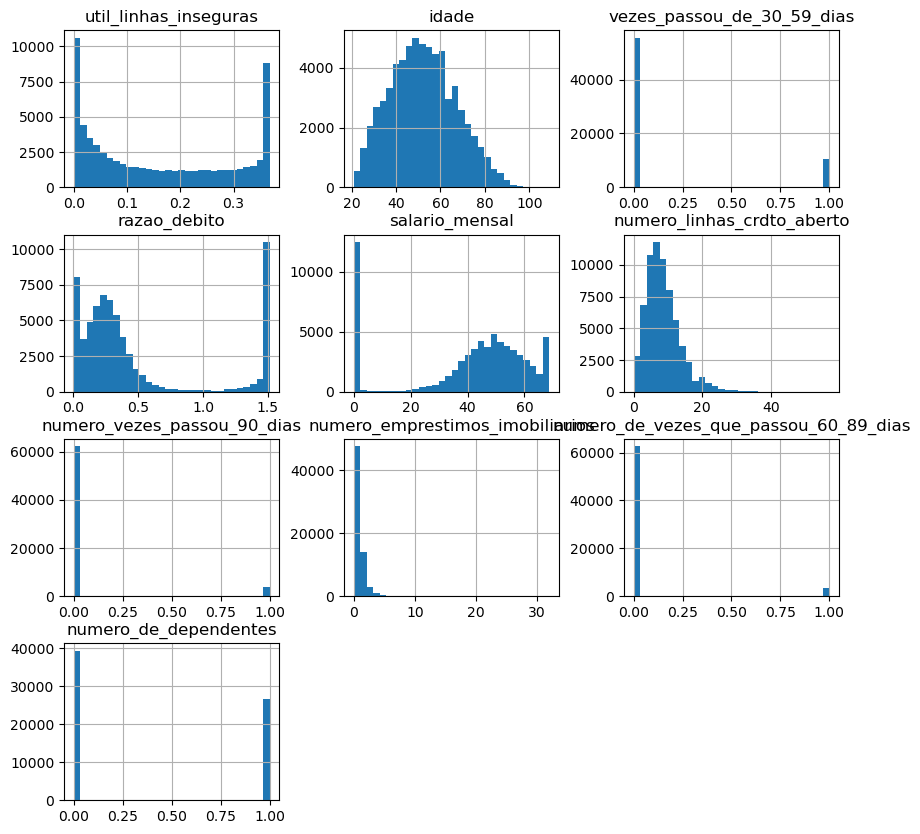

In [37]:
# Aplica a transformação Yeo-Johnson seguida do Winsorizer nas variáveis com outras escalas
X_full_train = capper.transform(yeo_transformer.transform(X_full_train))
X_train = capper.transform(yeo_transformer.transform(X_train))
X_val = capper.transform(yeo_transformer.transform(X_val))
X_test = capper.transform(yeo_transformer.transform(X_test))

# Imprime as dimensões dos dataframes
for df in [X_full_train, X_train, X_val, X_test]:
    print(f'{df=}:', df.shape)

# Plota histogramas das variáveis
X_train.hist(bins=30, figsize=(10, 10), layout=(4, 3));


### 3.4 Variáveis com outliers

<AxesSubplot: >

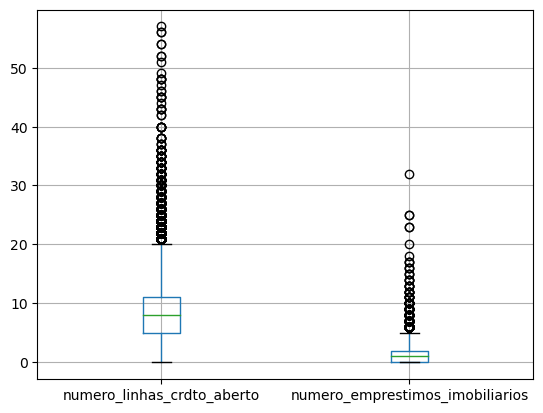

In [38]:
# Lista de variáveis com possíveis outliers
variaveis_outliers = [    'numero_linhas_crdto_aberto',    'numero_emprestimos_imobiliarios']

# Plota um gráfico de boxplot para as variáveis selecionadas do dataframe X_train
X_train[variaveis_outliers].boxplot()

<AxesSubplot: >

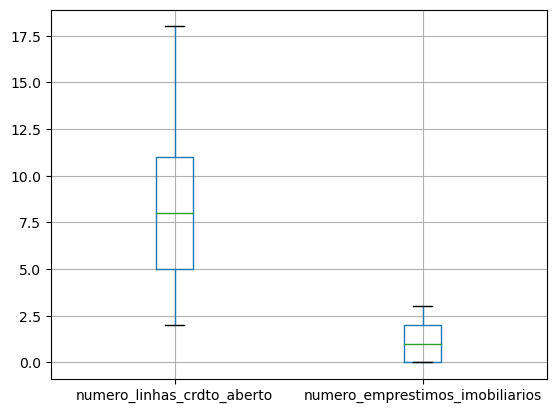

In [39]:
# Importando a classe Winsorizer do pacote feature_engine
from feature_engine.outliers import Winsorizer

# Criando um objeto Winsorizer com as configurações
capper2 = Winsorizer(
    variables=variaveis_outliers,
    capping_method="quantiles",
    tail="both",
    fold=0.05,
)

# Fazendo o ajuste do capper2 no dataframe X_train
capper2.fit(X_train)

# Aplicando a transformação do capper2 no dataframe X_train e armazenando na variável X_train_winsor2
X_train_winsor2 = capper2.transform(X_train)

# Plotando um gráfico de boxplot das variáveis selecionadas do dataframe X_train_winsor2 após a transformação
X_train_winsor2[variaveis_outliers].boxplot()

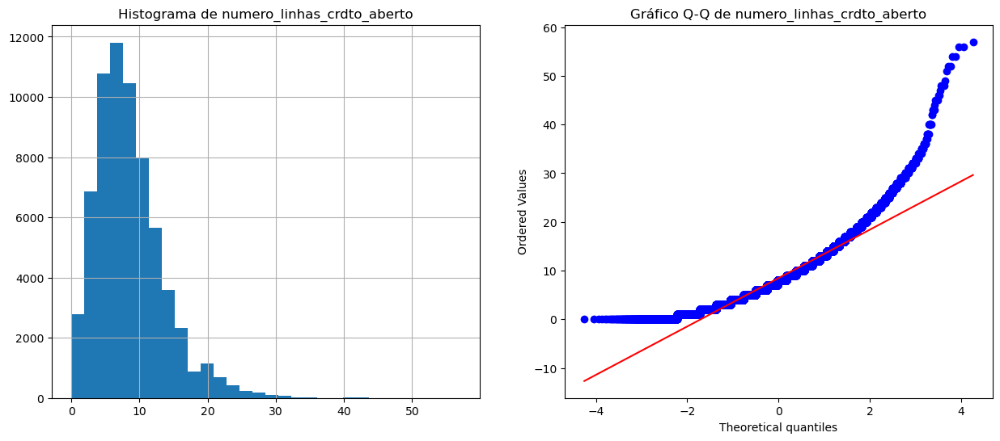

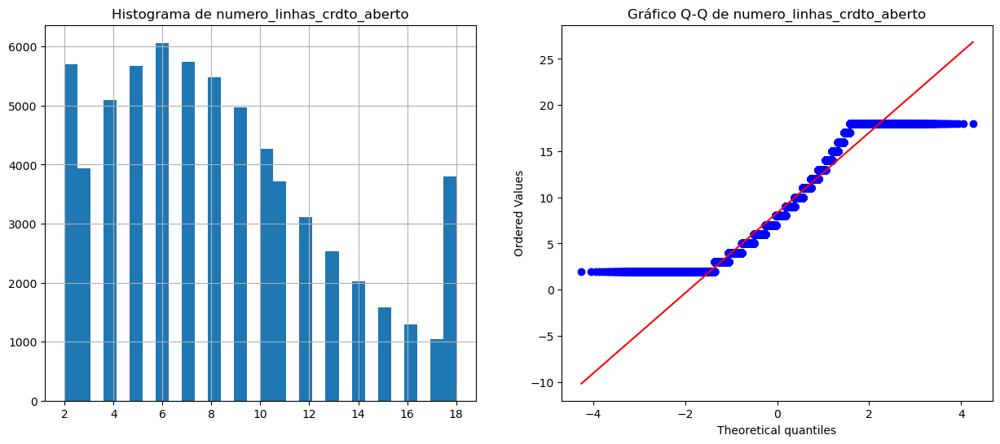

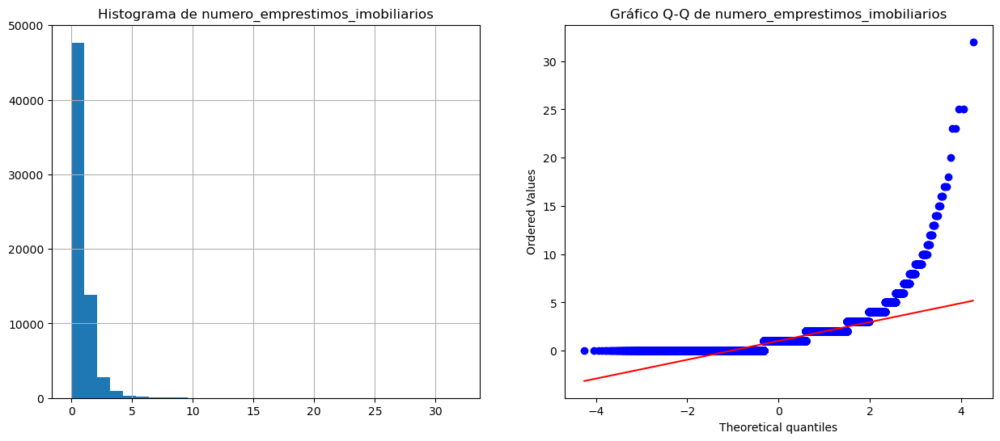

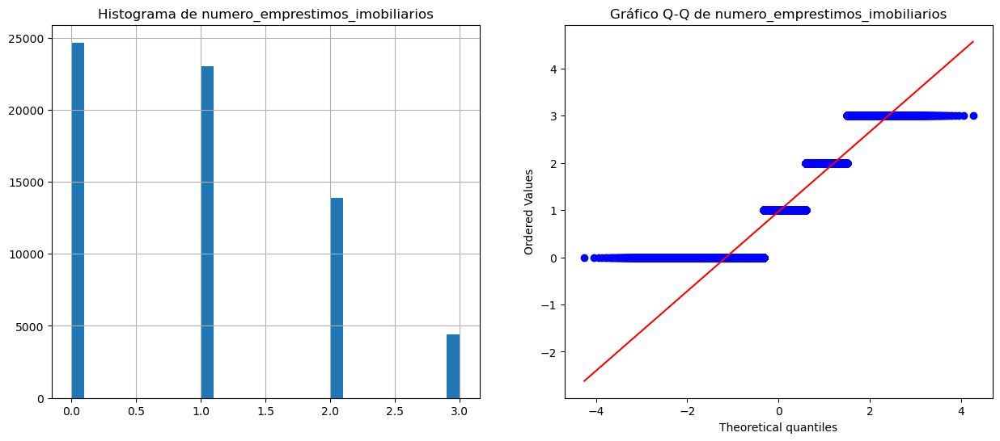

In [40]:
# Criar gráficos de histograma e Q-Q plot para as variáveis ​​'numero_linhas_crdto_aberto' e'numero_emprestimos_imobiliarios' antes e depois da limitação
diagnostic_plots(X_train, 'numero_linhas_crdto_aberto')
diagnostic_plots(X_train_winsor2, 'numero_linhas_crdto_aberto')
diagnostic_plots(X_train, 'numero_emprestimos_imobiliarios')
diagnostic_plots(X_train_winsor2, 'numero_emprestimos_imobiliarios')

In [41]:
X_full_train = capper2.fit_transform(X_full_train)
X_train = capper2.transform(X_train)
X_val = capper2.transform(X_val)
X_test = capper2.transform(X_test)

As transformações realizadas nesta seção foram:

Valores Ausentes:

- Identificação das variáveis com valores ausentes: 'salario_mensal' e 'numero_de_dependentes'.
- Criação de uma cópia de X_train para preencher os valores ausentes.
- Verificação de existência de padrão nos valores ausentes usando histograma e matriz nula.
- Como não havia padrão aparente, foi usada a imputação KNN para preencher os valores ausentes em todos os conjuntos.
- O novo conjunto de dados foi renomeado para X_full_train, X_train, X_val e X_test.

Variáveis Binárias:

- Identificação das variáveis com a maioria dos seus valores iguais a zero.
- Criação de uma função para transformar tais variáveis em formato binário, configurando valores diferentes de zero para um.
- Aplicação dessa transformação em X_full_train, X_train, X_val e X_test.
- Variáveis com Escalas Diferentes:

Identificação das variáveis com escalas diferentes.

- Uso da transformação Yeo-Johnson para transformar as variáveis em distribuição normal.
- Uso de gráficos diagnósticos para confirmar a transformação.
- Aplicação da técnica Winsorização para limitar os outliers e garantir que a nova distribuição não seja afetada por eles.
- Uso da discretização por frequência igual para discretizar as variáveis contínuas em 20 intervalos igualmente dimensionados.
- Aplicação das técnicas de transformação Yeo-Johnson e Winsorização em X_full_train, X_train, X_val e X_test.
- Uso da discretização por frequência igual para discretizar as variáveis contínuas em 20 intervalos igualmente dimensionados em X_train, X_val e X_test.

Variáveis com Outliers:

- Identificação das variáveis com outliers usando o método IQR.
- Criação de uma função para transformar as variáveis com outliers usando os quantis superior e inferior dos dados.
- Aplicação dessa transformação em X_full_train, X_train, X_val e X_test.

Os conjuntos finais de dados, X_full_train, X_train, X_val e X_test, estão agora prontos para serem utilizados na modelagem, permitindo a construção dos modelos preditivos.

## 4. Modelagem

Nesta seção, serão testados e otimizados três modelos (LightGBM, XGboost e Adaboost) em cada uma das quatro estratégias de amostragem (Sem sampling, Undersampling com NearMiss, Oversampling com SMOTE e Over e Undersampling com SMOTEENN) usando a biblioteca Optuna. O desempenho dos modelos será avaliado em termos de Fbeta score com beta=2 para o recall, que é uma métrica adequada para lidar com desequilíbrios de classe. Além disso, as métricas PR AUC e ROC AUC serão utilizadas para avaliar o desempenho do modelo, bem como as curvas de aprendizado e as matrizes de confusão.

Para cada estratégia de amostragem, a biblioteca Optuna será usada para otimizar hiperparâmetros dos modelos LightGBM, XGboost e Adaboost. Esses modelos serão treinados e testados com os dados de treinamento e teste para cada estratégia de amostragem. As métricas PR AUC e ROC AUC serão calculadas para avaliar o desempenho do modelo em cada estratégia de amostragem. A curva de aprendizado será plotada para cada modelo em cada estratégia de amostragem.

Além disso, as matrizes de confusão serão utilizadas para avaliar o desempenho do modelo em cada estratégia de amostragem, a fim de entender melhor as áreas em que os modelos podem estar errando. Por fim, os resultados serão comparados para determinar qual modelo e qual estratégia de amostragem tiveram o melhor desempenho no conjunto de dados em questão.

Na seção seguinte, será feito o ajuste fino dos hiperparâmentros das pipelines que apresentarem melhores resultados nas métricas, em geral.

In [19]:
# Reamostrando o conjunto de dados
X_train, y_train, X_test, y_test, _, _, _, _ = split_data(treino)

Treino: 66000 Validação: 22000 Teste: 22000


Para executar todos os passos do feature engineering de maneira modular e prática, construi-se uma classe de objeto que funcionará como transformador da API do sklearn. A classe herda de duas classes da biblioteca scikit-learn, BaseEstimator e TransformerMixin, que são utilizadas para permitir que a classe seja usada em conjunto com outras classes da biblioteca scikit-learn, como um pipeline.  

In [42]:
# Variáveis com dados faltantes, binárias, outras escalas e outliers
print('variaveis_com_faltantes:', variaveis_com_faltantes)
print('variaveis_binarias:', variaveis_binarias)
print('variaveis_outras_escalas:', variaveis_outras_escalas)
print('variaveis_outliers:', variaveis_outliers)

class Preprocessor(BaseEstimator, TransformerMixin):
    def __init__(self):
        # Tratamento dos dados faltantes com KNNImputer
        self.imputer = SklearnTransformerWrapper(KNNImputer(n_neighbors=2), variaveis_com_faltantes)
        # Transformação de variáveis binárias com Binarizer
        self.transformar_vars_com_zero = SklearnTransformerWrapper(Binarizer(), variaveis_binarias)
        # Transformação de variáveis que não seguem uma distribuição normal com Yeo-Johnson
        self.yeo = YeoJohnsonTransformer(variables=variaveis_outras_escalas)
        # Capping das variáveis que não seguem uma distribuição normal com Winsorizer
        self.cap_norm = Winsorizer(capping_method="quantiles", tail="both", fold=0.05, variables=variaveis_outras_escalas)
        # Capping das variáveis que possuem outliers com Winsorizer
        self.cap_outliers = Winsorizer(capping_method="quantiles", tail="both", fold=0.05, variables=variaveis_outliers)

    def fit(self, X, y=None):
        # Executa o ajuste dos dados de treinamento com os transformadores configurados
        X_imputed = self.imputer.fit_transform(X)
        X_norm = self.transformar_vars_com_zero.fit_transform(X_imputed)
        X_yeo = self.yeo.fit_transform(X_norm)
        X_norm_cap = self.cap_norm.fit_transform(X_yeo)
        self.cap_outliers.fit(X_norm_cap)
        return self

    def transform(self, X, y=None):
        # Executa a transformação dos dados de teste com os transformadores configurados
        X_imputed = self.imputer.transform(X)
        X_norm = self.transformar_vars_com_zero.transform(X_imputed)
        X_yeo = self.yeo.transform(X_norm)
        X_norm_cap = self.cap_norm.transform(X_yeo)
        X_cap = self.cap_outliers.transform(X_norm_cap)
        return X_cap

    def fit_transform(self, X, y=None):
        # Executa o ajuste e transformação dos dados de treinamento com os transformadores configurados
        return self.fit(X).transform(X)


variaveis_com_faltantes: ['salario_mensal', 'numero_de_dependentes']
variaveis_binarias: ['vezes_passou_de_30_59_dias', 'numero_vezes_passou_90_dias', 'numero_de_vezes_que_passou_60_89_dias', 'numero_de_dependentes']
variaveis_outras_escalas: ['razao_debito', 'salario_mensal', 'util_linhas_inseguras']
variaveis_outliers: ['numero_linhas_crdto_aberto', 'numero_emprestimos_imobiliarios']


In [ ]:
# Criando uma instância da classe Preprocessor que definimos anteriormente
preprocessor = Preprocessor()

# Aplicando o pré-processamento aos dados de treino usando o método fit_transform da instância preprocessor
X_train_processed = preprocessor.fit_transform(X_train)

# Aplicando o pré-processamento aos dados de teste usando o método transform da instância preprocessor
X_test_processed = preprocessor.transform(X_test)

# Calculando o peso da amostra (sample_weight) para ser usado em um modelo de aprendizado de máquina. A fórmula usada aqui é a razão entre o número de exemplos negativos e o número de exemplos positivos no conjunto de treino.
sample_weight = (y_train == 0).sum() / (y_train == 1).sum()

### 4.1 Sem sampling 

- Nesta subseção, não é aplicada nenhuma técnica de amostragem nos dados.
- Em vez disso, são utilizados parâmetros de balancemento que atribuem pesos diferentes para cada classe. No caso do Adaboost, apesar de tal parâmetro não existir, por combinar uma grande quantidade de modelos simples, é menos suceptível a se sobreajustar aos dados.
- O objetivo é avaliar o desempenho do modelo sem qualquer ajuste para a desproporção de classes.

In [ ]:
# Define a métrica de avaliação como F2 score
f2_score = make_scorer(fbeta_score, beta=2)

# Define a função objetivo a ser minimizada pelo Optuna
def objective(trial):
     # Define hiperparâmetros a serem ajustados para o modelo
    model_name = trial.suggest_categorical('model', ['lgbm', 'xgb', 'adaboost'])

    if model_name == 'lgbm':
        params = {
            'num_leaves': trial.suggest_int('num_leaves', 2, 128),
            'max_depth': trial.suggest_int('max_depth', 2, 15),
            'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 0.1),
            'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'reg_alpha': trial.suggest_loguniform('reg_alpha', 0.001, 10.0),
            'reg_lambda': trial.suggest_loguniform('reg_lambda', 0.001, 10.0),
        }
        model = LGBMClassifier(**params, is_unbalance=True)

    elif model_name == 'xgb':
        params = {
            'max_depth': trial.suggest_int('max_depth', 2, 15),
            'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 0.1),
            'gamma': trial.suggest_loguniform('gamma', 0.001, 10.0),
            'min_child_weight': trial.suggest_loguniform('min_child_weight', 0.001, 10.0),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'reg_alpha': trial.suggest_loguniform('reg_alpha', 0.001, 10.0),
            'reg_lambda': trial.suggest_loguniform('reg_lambda', 0.001, 10.0),
            'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        }
        model = XGBClassifier(**params,  scale_pos_weight = sample_weight)

    else:
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 50, 500),
            'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 0.1)
        }
        model = AdaBoostClassifier(**params)

    model.fit(X_train_processed, y_train)

    # Use cross_val_score para calcular o F2 score no conjunto de validação
    scores = cross_val_score(model, X_train_processed, y_train, cv=StratifiedKFold(), scoring=f2_score)

    # Retorna a pontuação média
    return scores.mean()


# Execute o Optuna para encontrar os melhores hiperparâmetros para os três modelos
study = optuna.create_study(direction='maximize', sampler=TPESampler())
study.optimize(objective, n_trials=40)


lgbm
PR AUC: 0.370
ROC AUC: 0.859
xgb
PR AUC: 0.367
ROC AUC: 0.859
ada
PR AUC: 0.366
ROC AUC: 0.835


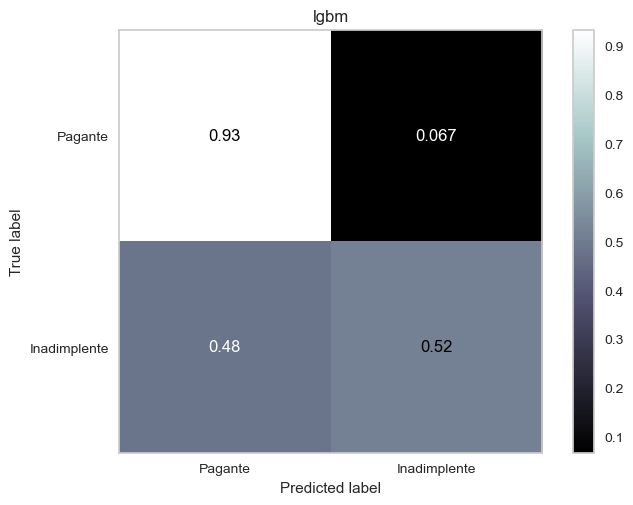

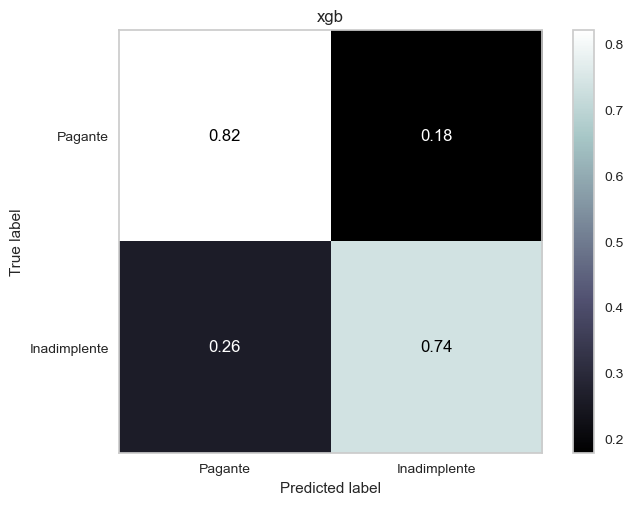

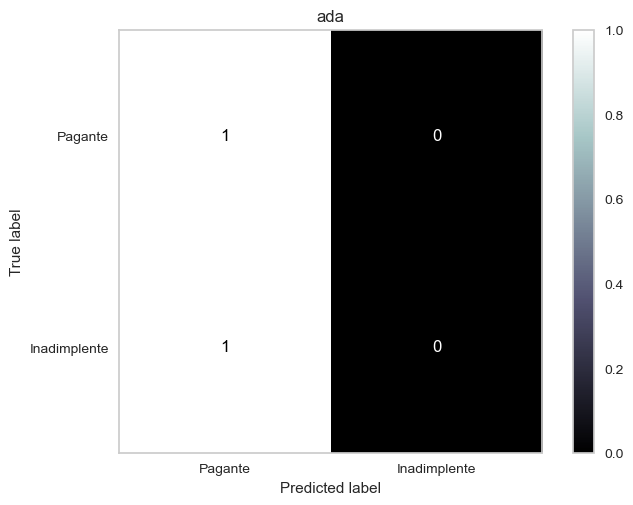

In [22]:
# Criar um dicionário com os melhores modelos para cada algoritmo
best_models = {}

for trial in study.trials:
    model_name = trial.params['model']
    score = trial.value
    params = trial.params
    if model_name not in best_models or score > best_models[model_name]['score']:
        del params['model']
        best_models[model_name] = {'score': score, 'params': params}

# Instanciar o melhor modelo para cada algoritmo com os seus respectivos melhores parâmetros
best_lgbm_model = LGBMClassifier(**best_models['lgbm']['params'], is_unbalance=True)
best_xgb_model = XGBClassifier(**best_models['xgb']['params'], scale_pos_weight = (y_train == 0).sum() / (y_train == 1).sum())
best_adaboost_model = AdaBoostClassifier(**best_models['adaboost']['params'])

# Criar um dicionário com os modelos finais
final_models = {
    'lgbm': best_lgbm_model,
    'xgb': best_xgb_model,
    'ada': best_adaboost_model,
}

# Treinar os modelos finais no conjunto completo de treinamento e fazer previsões no conjunto de teste
test_preds = {}
for model_name, model in final_models.items():
    # Treinar o modelo no conjunto de treinamento completo
    model.fit(X_train_processed, y_train)

    # Fazer previsões para o conjunto de teste
    y_pred = model.predict(X_test_processed)
    y_pred_proba = model.predict_proba(X_test_processed)[:,1]

    # Calcular as métricas PR AUC e ROC AUC
    precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
    roc_auc = roc_auc_score(y_test, y_pred_proba)
    auc_score = auc(recall, precision)
    print(model_name)
    print('PR AUC: %.3f' % auc_score)
    print('ROC AUC: %.3f' % roc_auc)

    # Plotar a matriz de confusão normalizada para o conjunto de teste
    ConfusionMatrixDisplay.from_predictions(y_test, y_pred, cmap='bone', display_labels=['Pagante','Inadimplente'], normalize='true')
    plt.title(model_name)
    plt.grid(False)


In [23]:
# Faça um loop através do dicionário best_models e plote os relatórios de classificação desbalanceada da bibliotrca imblearn
for nome, modelo in final_models.items():
    # Fit do pipeline no conjunto de treinamento completo
    modelo.fit(X_train_processed, y_train)

    # Predição da variável-alvo no conjunto de teste
    y_pred = modelo.predict(X_test_processed)

    # Imprimir o relatório de classificação
    print(nome)
    print(classification_report_imbalanced(y_test,y_pred))

lgbm
                   pre       rec       spe        f1       geo       iba       sup

          0       0.96      0.93      0.52      0.95      0.70      0.50     20534
          1       0.35      0.52      0.93      0.42      0.70      0.46      1466

avg / total       0.92      0.91      0.55      0.91      0.70      0.50     22000

xgb
                   pre       rec       spe        f1       geo       iba       sup

          0       0.98      0.82      0.74      0.89      0.78      0.61     20534
          1       0.23      0.74      0.82      0.35      0.78      0.60      1466

avg / total       0.93      0.82      0.74      0.86      0.78      0.61     22000

ada
                   pre       rec       spe        f1       geo       iba       sup

          0       0.93      1.00      0.00      0.97      0.00      0.00     20534
          1       0.00      0.00      1.00      0.00      0.00      0.00      1466

avg / total       0.87      0.93      0.07      0.90      0.00    

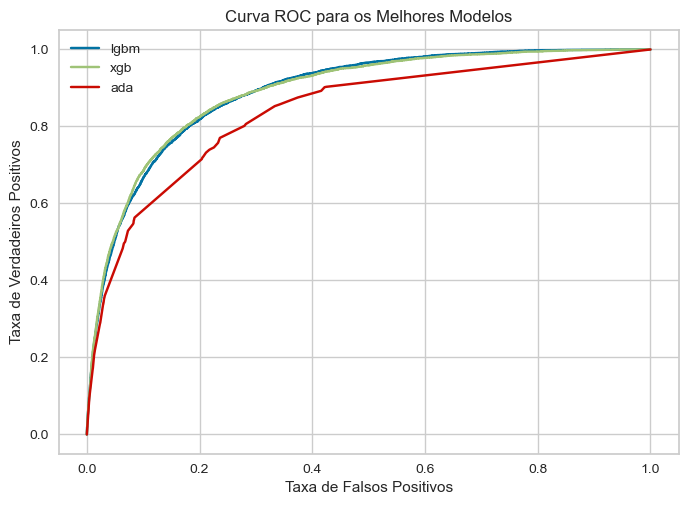

In [24]:
# Criar uma figura e eixos para o gráfico
fig, ax = plt.subplots()

# Percorrer o dicionário best_models e plotar as curvas ROC
for name, model in final_models.items():
    plot_roc_curve(model.fit(X_train_processed, y_train), X_train_processed, y_train, ax=ax, label=name)

# Definir o título, rótulos dos eixos x e y
ax.set_title('Curva ROC para os Melhores Modelos')
ax.set_xlabel('Taxa de Falsos Positivos')
ax.set_ylabel('Taxa de Verdadeiros Positivos')

# Adicionar uma legenda ao gráfico
ax.legend()

# Exibir o gráfico
plt.show()

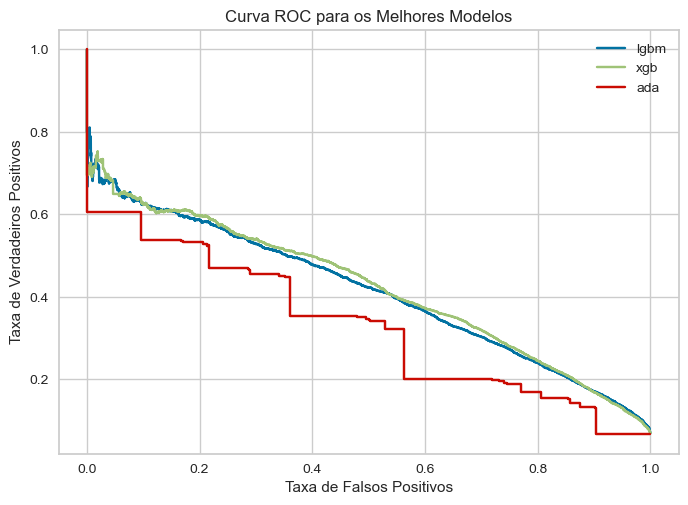

In [25]:
# Criar uma figura e eixos para o gráfico
fig, ax = plt.subplots()

# Percorrer o dicionário best_models e plotar as curvas ROC
for name, model in final_models.items():
    plot_precision_recall_curve(model.fit(X_train_processed, y_train), X_train_processed, y_train, ax=ax, label=name)

# Definir o título, rótulos dos eixos x e y
ax.set_title('Curva ROC para os Melhores Modelos')
ax.set_xlabel('Taxa de Falsos Positivos')
ax.set_ylabel('Taxa de Verdadeiros Positivos')

# Adicionar uma legenda ao gráfico
ax.legend()

# Exibir o gráfico
plt.show()

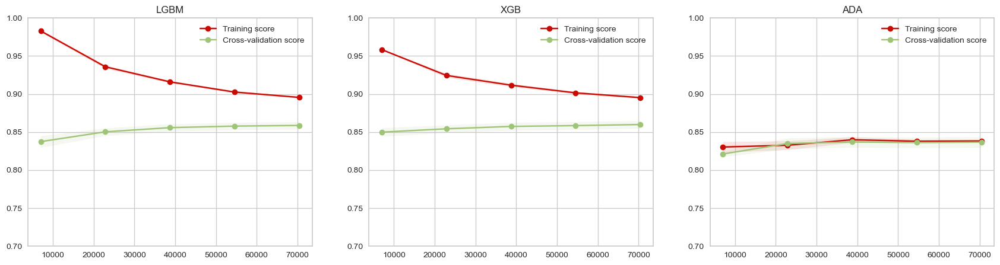

In [26]:
# Define uma função que plota múltiplas curvas de aprendizado para diferentes modelos de machine learning
def plot_multiple_learning_curves(models, X, y, train_sizes=np.linspace(.1, 1.0, 5)):
    # Cria uma figura com subplots para cada modelo
    fig, axes = plt.subplots(1, len(models), figsize=(len(models)*7, 5))

    for i, model in enumerate(models.keys()):
        # Cria uma curva de aprendizado para o modelo atual
        train_sizes, train_scores, test_scores = learning_curve(
            models[model], X, y, cv=StratifiedKFold(), n_jobs=-1, train_sizes=train_sizes, scoring='roc_auc')

        # Calcula as médias e desvios padrão dos scores de treino e validação para cada tamanho de conjunto de treinamento
        train_scores_mean = np.mean(train_scores, axis=1)
        train_scores_std = np.std(train_scores, axis=1)
        test_scores_mean = np.mean(test_scores, axis=1)
        test_scores_std = np.std(test_scores, axis=1)

        # Preenche a área entre as barras de erro das curvas de treino e validação com cores diferentes
        axes[i].grid()
        axes[i].fill_between(train_sizes, train_scores_mean - train_scores_std,
                             train_scores_mean + train_scores_std, alpha=0.1,
                             color="r")
        axes[i].fill_between(train_sizes, test_scores_mean - test_scores_std,
                             test_scores_mean + test_scores_std, alpha=0.1, color="g")
        # Plota as curvas de treino e validação
        axes[i].plot(train_sizes, train_scores_mean, 'o-', color="r",
                     label="Training score")
        axes[i].plot(train_sizes, test_scores_mean, 'o-', color="g",
                     label="Cross-validation score")
        # Adiciona legenda, título e configurações adicionais para cada subplot
        axes[i].legend(loc="best")
        axes[i].set_title(f"{model.upper()}")
        axes[i].set_ylim(0.7, 1)
        axes[i].grid()
        
    # Mostra o gráfico final
    plt.show()

# Chama a função para plotar curvas de aprendizado para os modelos finais, usando o conjunto de treinamento completo
plot_multiple_learning_curves(final_models, X_train_processed, y_train)


In [27]:
# Este loop salva cada modelo em um arquivo pickle com um timestamp no nome do arquivo
for name, model in best_models.items():
    now = datetime.datetime.now().strftime('%Y-%m-%d-%H-%M')
    with open(f'models/optuna_imbalanced_{name}_{now}.pkl', 'wb') as file:
        pickle.dump(model, file)

### 4.2 Undersampling

- Nesta subseção, é aplicada a técnica de undersampling utilizando o algoritmo NearMiss.
- O objetivo é reduzir o número de instâncias da classe majoritária para que a proporção de classes seja mais equilibrada.
- Cada modelo é ajustado nos dados reduzidos pelo NearMiss, e seu desempenho é avaliado.

In [ ]:
# Define a métrica de avaliação como F2 score
f2_score = make_scorer(fbeta_score, beta=2)

# Define a função objetivo a ser minimizada pelo Optuna
def objective(trial):
     # Define hiperparâmetros a serem ajustados para o modelo
    model_name = trial.suggest_categorical('model', ['lgbm', 'xgb', 'adaboost'])

    if model_name == 'lgbm':
        params = {
            'num_leaves': trial.suggest_int('num_leaves', 2, 128),
            'max_depth': trial.suggest_int('max_depth', 2, 15),
            'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 0.1),
            'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'reg_alpha': trial.suggest_loguniform('reg_alpha', 0.001, 10.0),
            'reg_lambda': trial.suggest_loguniform('reg_lambda', 0.001, 10.0),
        }
        model = LGBMClassifier(**params)

    elif model_name == 'xgb':
        params = {
            'max_depth': trial.suggest_int('max_depth', 2, 15),
            'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 0.1),
            'gamma': trial.suggest_loguniform('gamma', 0.001, 10.0),
            'min_child_weight': trial.suggest_loguniform('min_child_weight', 0.001, 10.0),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'reg_alpha': trial.suggest_loguniform('reg_alpha', 0.001, 10.0),
            'reg_lambda': trial.suggest_loguniform('reg_lambda', 0.001, 10.0),
            'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        }
        model = XGBClassifier(**params)

    else:
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 50, 500),
            'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 0.1)
        }
        model = AdaBoostClassifier(**params)

    # Treinar o modelo com na pipeline de cross-validation
    steps = [('under', NearMiss()), ('model',model)]
    pipeline = imbPipeline(steps=steps)
    pipeline.fit(X_train_processed, y_train)

    # Use cross_val_score para calcular o F2 score no conjunto de validação
    scores = cross_val_score(pipeline, X_train_processed, y_train, cv=StratifiedKFold(), scoring=f2_score)

    # Retorna a pontuação média
    return scores.mean()

# Execute o Optuna para encontrar os melhores hiperparâmetros para os três modelos
study = optuna.create_study(direction='maximize', sampler=TPESampler())
study.optimize(objective, n_trials=40)

lgbm
PR AUC: 0.275
ROC AUC: 0.768
xgb
PR AUC: 0.282
ROC AUC: 0.796
adaboost
PR AUC: 0.293
ROC AUC: 0.801


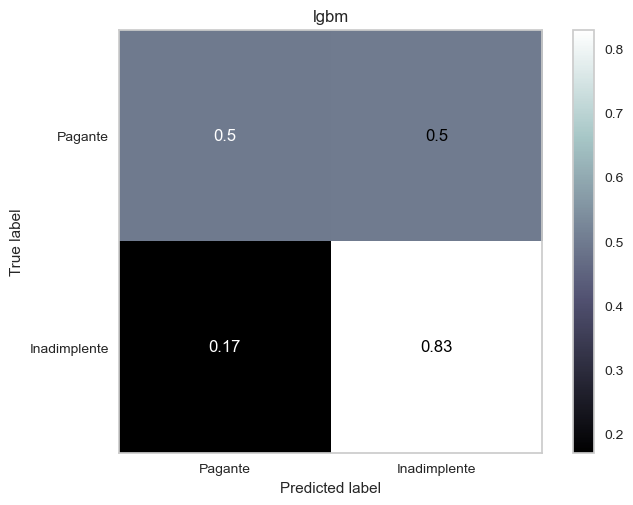

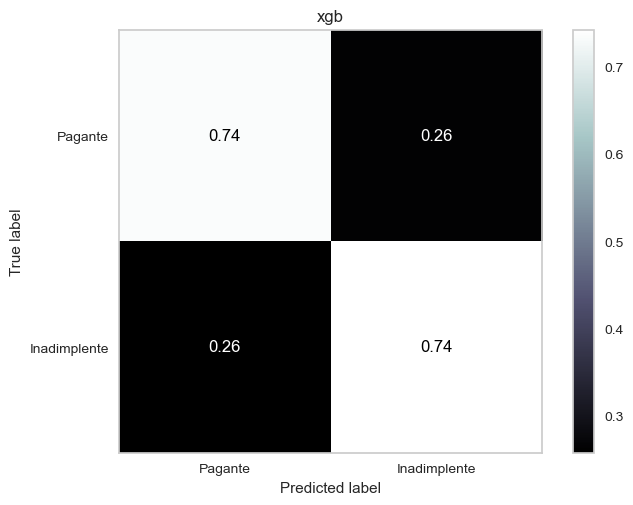

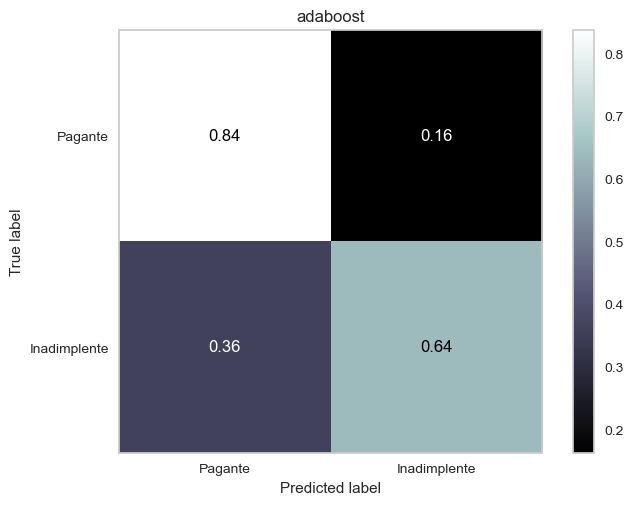

In [29]:
# Criar um dicionário com os melhores modelos para cada algoritmo
best_models = {}

for trial in study.trials:
    model_name = trial.params['model']
    score = trial.value
    params = trial.params
    if model_name not in best_models or score > best_models[model_name]['score']:
        del params['model']
        best_models[model_name] = {'score': score, 'params': params}

# Instanciar o melhor modelo para cada algoritmo com os seus respectivos melhores parâmetros
best_lgbm_model = LGBMClassifier(**best_models['lgbm']['params'])
best_xgb_model = XGBClassifier(**best_models['xgb']['params'])
best_adaboost_model = AdaBoostClassifier(**best_models['adaboost']['params'])

# Criar um dicionário com os modelos finais
final_models = {
    'lgbm': best_lgbm_model,
    'xgb': best_xgb_model,
    'adaboost': best_adaboost_model,
}

# Treinar os modelos finais no conjunto completo de treinamento e fazer previsões no conjunto de teste
test_preds = {}
for model_name, model in final_models.items():
    # Treinar o modelo no conjunto de treinamento completo
    steps = [('under', NearMiss()), ('model',model)]
    pipeline = imbPipeline(steps=steps)
    pipeline.fit(X_train_processed, y_train)
    final_models[model_name] = pipeline

    # Fazer previsões para o conjunto de teste
    y_pred = pipeline.predict(X_test_processed)
    y_pred_proba = pipeline.predict_proba(X_test_processed)[:,1]

    # Calcular as métricas PR AUC e ROC AUC
    precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
    roc_auc = roc_auc_score(y_test, y_pred_proba)
    auc_score = auc(recall, precision)
    print(model_name)
    print('PR AUC: %.3f' % auc_score)
    print('ROC AUC: %.3f' % roc_auc)

    # Plotar a matriz de confusão normalizada para o conjunto de teste
    ConfusionMatrixDisplay.from_predictions(y_test, y_pred, cmap='bone', display_labels=['Pagante','Inadimplente'], normalize='true')
    plt.title(model_name)
    plt.grid(False)


In [30]:
# Faça um loop através do dicionário best_models e plote os relatórios de classificação desbalanceada da bibliotrca imblearn
for nome, modelo in final_models.items():
    # Fit do pipeline no conjunto de treinamento completo
    modelo.fit(X_train_processed, y_train)

    # Predição da variável-alvo no conjunto de teste
    y_pred = modelo.predict(X_test_processed)

    # Imprimir o relatório de classificação
    print(nome)
    print(classification_report_imbalanced(y_test,y_pred))


lgbm
                   pre       rec       spe        f1       geo       iba       sup

          0       0.98      0.50      0.83      0.66      0.64      0.40     20534
          1       0.11      0.83      0.50      0.19      0.64      0.43      1466

avg / total       0.92      0.52      0.81      0.63      0.64      0.40     22000

xgb
                   pre       rec       spe        f1       geo       iba       sup

          0       0.98      0.74      0.74      0.84      0.74      0.55     20534
          1       0.17      0.74      0.74      0.27      0.74      0.55      1466

avg / total       0.92      0.74      0.74      0.80      0.74      0.55     22000

adaboost
                   pre       rec       spe        f1       geo       iba       sup

          0       0.97      0.84      0.64      0.90      0.73      0.55     20534
          1       0.22      0.64      0.84      0.33      0.73      0.52      1466

avg / total       0.92      0.82      0.65      0.86      0.7

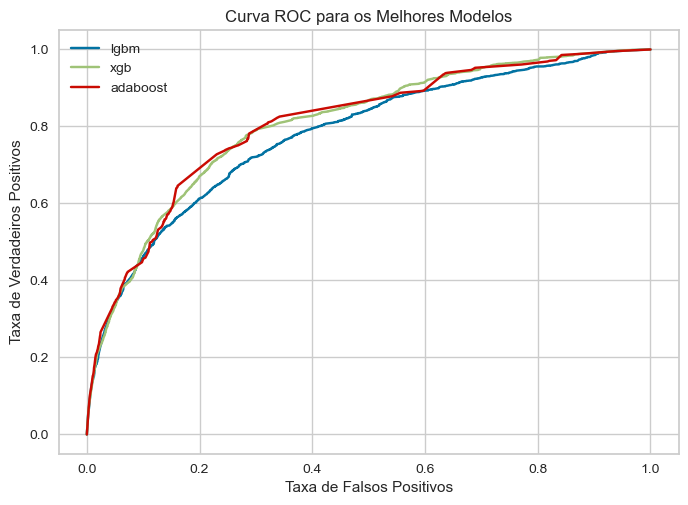

In [31]:
# Criar uma figura e eixos para o gráfico
fig, ax = plt.subplots()

# Percorrer o dicionário best_models e plotar as curvas ROC
for name, model in final_models.items():
    plot_roc_curve(model.fit(X_train_processed, y_train), X_train_processed, y_train, ax=ax, label=name)

# Definir o título, rótulos dos eixos x e y
ax.set_title('Curva ROC para os Melhores Modelos')
ax.set_xlabel('Taxa de Falsos Positivos')
ax.set_ylabel('Taxa de Verdadeiros Positivos')

# Adicionar uma legenda ao gráfico
ax.legend()

# Exibir o gráfico
plt.show()

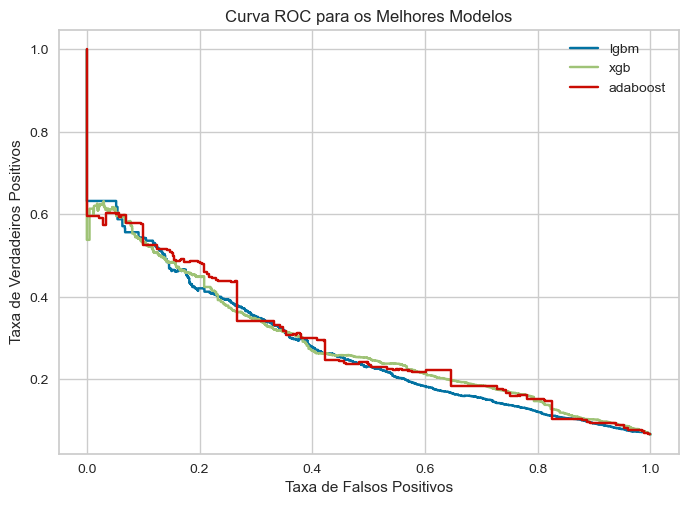

In [32]:
# Criar uma figura e eixos para o gráfico
fig, ax = plt.subplots()

# Percorrer o dicionário best_models e plotar as curvas ROC
for name, model in final_models.items():
    plot_precision_recall_curve(model.fit(X_train_processed, y_train), X_train_processed, y_train, ax=ax, label=name)

# Definir o título, rótulos dos eixos x e y
ax.set_title('Curva ROC para os Melhores Modelos')
ax.set_xlabel('Taxa de Falsos Positivos')
ax.set_ylabel('Taxa de Verdadeiros Positivos')

# Adicionar uma legenda ao gráfico
ax.legend()

# Exibir o gráfico
plt.show()

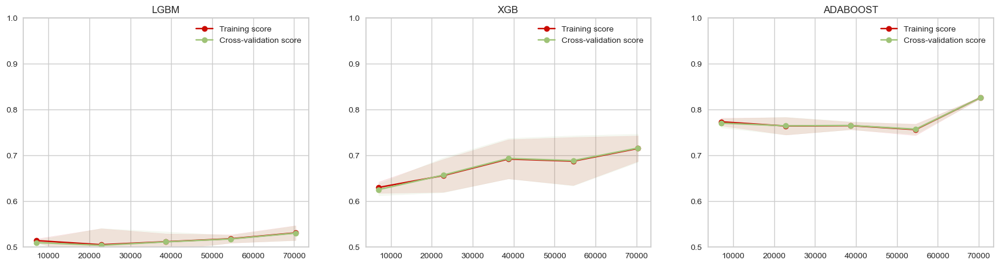

In [33]:
# Define uma função que plota múltiplas curvas de aprendizado para diferentes modelos de machine learning
def plot_multiple_learning_curves(models, X, y, train_sizes=np.linspace(.1, 1.0, 5)):
    # Cria uma figura com subplots para cada modelo
    fig, axes = plt.subplots(1, len(models), figsize=(len(models)*7, 5))

    for i, model in enumerate(models.keys()):
        # Cria uma curva de aprendizado para o modelo atual
        train_sizes, train_scores, test_scores = learning_curve(
            models[model], X, y, cv=StratifiedKFold(), n_jobs=-1, train_sizes=train_sizes, scoring='accuracy')

        # Calcula as médias e desvios padrão dos scores de treino e validação para cada tamanho de conjunto de treinamento
        train_scores_mean = np.mean(train_scores, axis=1)
        train_scores_std = np.std(train_scores, axis=1)
        test_scores_mean = np.mean(test_scores, axis=1)
        test_scores_std = np.std(test_scores, axis=1)

        # Preenche a área entre as barras de erro das curvas de treino e validação com cores diferentes
        axes[i].grid()
        axes[i].fill_between(train_sizes, train_scores_mean - train_scores_std,
                             train_scores_mean + train_scores_std, alpha=0.1,
                             color="r")
        axes[i].fill_between(train_sizes, test_scores_mean - test_scores_std,
                             test_scores_mean + test_scores_std, alpha=0.1, color="g")
        # Plota as curvas de treino e validação
        axes[i].plot(train_sizes, train_scores_mean, 'o-', color="r",
                     label="Training score")
        axes[i].plot(train_sizes, test_scores_mean, 'o-', color="g",
                     label="Cross-validation score")
        # Adiciona legenda, título e configurações adicionais para cada subplot
        axes[i].legend(loc="best")
        axes[i].set_title(f"{model.upper()}")
        axes[i].set_ylim(0.5, 1)
        axes[i].grid()
        
    # Mostra o gráfico final
    plt.show()

# Chama a função para plotar curvas de aprendizado para os modelos finais, usando o conjunto de treinamento completo
plot_multiple_learning_curves(final_models, X_train_processed, y_train)


In [34]:
# Este loop salva cada modelo em um arquivo pickle com um timestamp no nome do arquivo
for name, model in best_models.items():
    now = datetime.datetime.now().strftime('%Y-%m-%d-%H-%M')
    with open(f'models/optuna_under_{name}_{now}.pkl', 'wb') as file:
        pickle.dump(model, file)

### 4.3 Oversampling

- Nesta subseção, é aplicada a técnica de oversampling utilizando o algoritmo SMOTE (Synthetic Minority Over-sampling Technique).
- O objetivo é gerar novas instâncias sintéticas da classe minoritária para aumentar sua representação nos dados.
- Cada modelo é ajustado nos dados aumentados pelo SMOTE, e seu desempenho é avaliado.

In [ ]:
# Define a métrica de avaliação como F2 score
f2_score = make_scorer(fbeta_score, beta=2)

# Define a função objetivo a ser minimizada pelo Optuna
def objective(trial):
     # Define hiperparâmetros a serem ajustados para o modelo
    model_name = trial.suggest_categorical('model', ['lgbm', 'xgb', 'adaboost'])

    if model_name == 'lgbm':
        params = {
            'num_leaves': trial.suggest_int('num_leaves', 2, 128),
            'max_depth': trial.suggest_int('max_depth', 2, 15),
            'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 0.1),
            'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'reg_alpha': trial.suggest_loguniform('reg_alpha', 0.001, 10.0),
            'reg_lambda': trial.suggest_loguniform('reg_lambda', 0.001, 10.0),
        }
        model = LGBMClassifier(**params)

    elif model_name == 'xgb':
        params = {
            'max_depth': trial.suggest_int('max_depth', 2, 15),
            'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 0.1),
            'gamma': trial.suggest_loguniform('gamma', 0.001, 10.0),
            'min_child_weight': trial.suggest_loguniform('min_child_weight', 0.001, 10.0),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'reg_alpha': trial.suggest_loguniform('reg_alpha', 0.001, 10.0),
            'reg_lambda': trial.suggest_loguniform('reg_lambda', 0.001, 10.0),
            'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        }
        model = XGBClassifier(**params)

    else:
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 50, 500),
            'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 0.1)
        }
        model = AdaBoostClassifier(**params)

    # Treinar o modelo com na pipeline de cross-validation
    steps = [('under', SMOTE()), ('model',model)]
    pipeline = imbPipeline(steps=steps)

    # Use cross_val_score para calcular o F2 score no conjunto de validação
    scores = cross_val_score(pipeline, X_train_processed, y_train, cv=StratifiedKFold(), scoring=f2_score)

    # Retorna a pontuação média
    return scores.mean()

# Execute o Optuna para encontrar os melhores hiperparâmetros para os três modelos
study = optuna.create_study(direction='maximize', sampler=TPESampler())
study.optimize(objective, n_trials=40)

lgbm
PR AUC: 0.329
ROC AUC: 0.816
xgb
PR AUC: 0.221
ROC AUC: 0.736
adaboost
PR AUC: 0.286
ROC AUC: 0.785


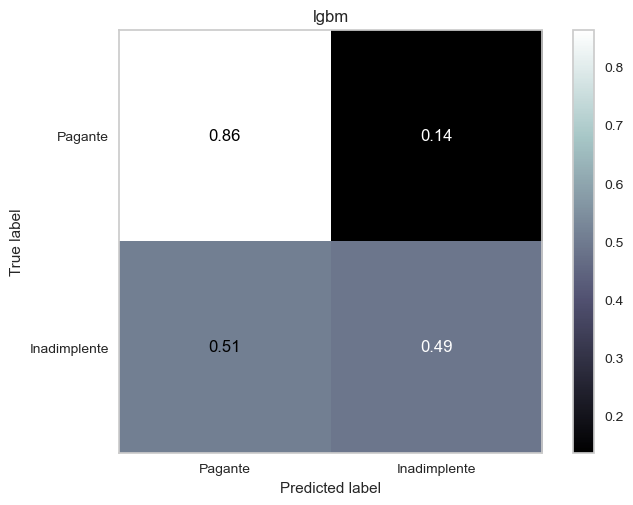

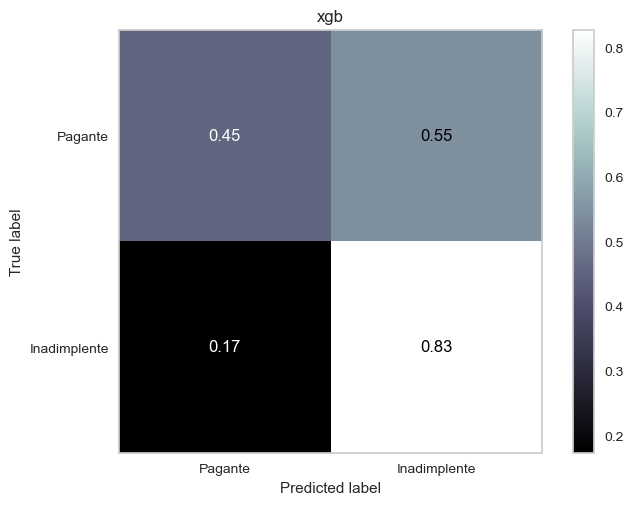

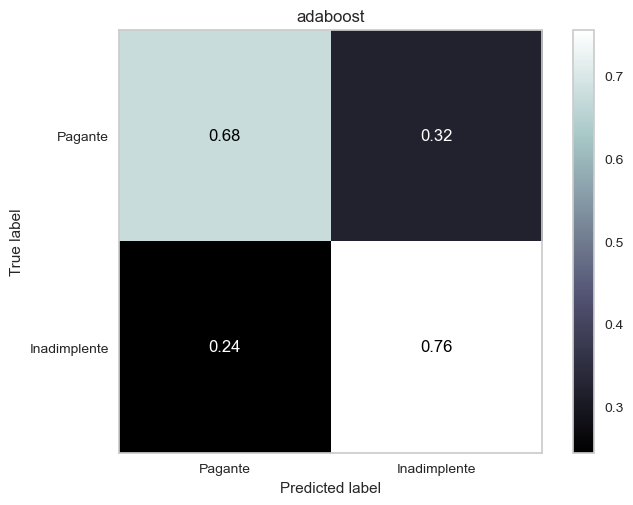

In [37]:
# Criar um dicionário com os melhores modelos para cada algoritmo
best_models = {}

for trial in study.trials:
    model_name = trial.params['model']
    score = trial.value
    params = trial.params
    if model_name not in best_models or score > best_models[model_name]['score']:
        del params['model']
        best_models[model_name] = {'score': score, 'params': params}

# Instanciar o melhor modelo para cada algoritmo com os seus respectivos melhores parâmetros
best_lgbm_model = LGBMClassifier(**best_models['lgbm']['params'])
best_xgb_model = XGBClassifier(**best_models['xgb']['params'])
best_adaboost_model = AdaBoostClassifier(**best_models['adaboost']['params'])

# Criar um dicionário com os modelos finais
final_models = {
    'lgbm': best_lgbm_model,
    'xgb': best_xgb_model,
    'adaboost': best_adaboost_model,
}

# Treinar os modelos finais no conjunto completo de treinamento e fazer previsões no conjunto de teste
test_preds = {}
for model_name, model in final_models.items():
    # Treinar o modelo no conjunto de treinamento completo
    steps = [('under', NearMiss()), ('model',model)]
    pipeline = imbPipeline(steps=steps)
    pipeline.fit(X_train_processed, y_train)
    final_models[model_name] = pipeline

    # Fazer previsões para o conjunto de teste
    y_pred = pipeline.predict(X_test_processed)
    y_pred_proba = pipeline.predict_proba(X_test_processed)[:,1]

    # Calcular as métricas PR AUC e ROC AUC
    precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
    roc_auc = roc_auc_score(y_test, y_pred_proba)
    auc_score = auc(recall, precision)
    print(model_name)
    print('PR AUC: %.3f' % auc_score)
    print('ROC AUC: %.3f' % roc_auc)

    # Plotar a matriz de confusão normalizada para o conjunto de teste
    ConfusionMatrixDisplay.from_predictions(y_test, y_pred, cmap='bone', display_labels=['Pagante','Inadimplente'], normalize='true')
    plt.title(model_name)
    plt.grid(False)

In [38]:
# Faça um loop através do dicionário best_models e plote os relatórios de classificação desbalanceada da bibliotrca imblearn
for nome, modelo in final_models.items():
    # Fit do pipeline no conjunto de treinamento completo
    modelo.fit(X_train_processed, y_train)

    # Predição da variável-alvo no conjunto de teste
    y_pred = modelo.predict(X_test_processed)

    # Imprimir o relatório de classificação
    print(nome)
    print(classification_report_imbalanced(y_test,y_pred))

lgbm
                   pre       rec       spe        f1       geo       iba       sup

          0       0.96      0.86      0.49      0.91      0.65      0.44     20534
          1       0.21      0.49      0.86      0.29      0.65      0.41      1466

avg / total       0.91      0.84      0.51      0.87      0.65      0.44     22000

xgb
                   pre       rec       spe        f1       geo       iba       sup

          0       0.97      0.45      0.83      0.62      0.61      0.36     20534
          1       0.10      0.83      0.45      0.17      0.61      0.39      1466

avg / total       0.92      0.48      0.80      0.59      0.61      0.36     22000

adaboost
                   pre       rec       spe        f1       geo       iba       sup

          0       0.97      0.68      0.76      0.80      0.71      0.51     20534
          1       0.14      0.76      0.68      0.24      0.71      0.51      1466

avg / total       0.92      0.68      0.75      0.76      0.7

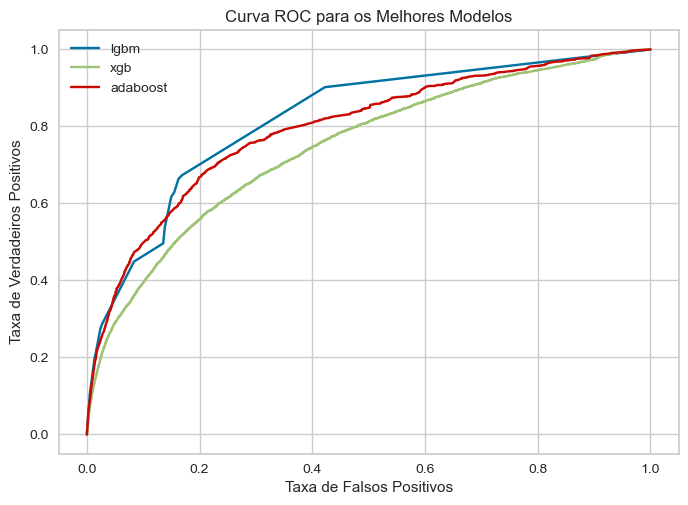

In [39]:
# Criar uma figura e eixos para o gráfico
fig, ax = plt.subplots()

# Percorrer o dicionário best_models e plotar as curvas ROC
for name, model in final_models.items():
    plot_roc_curve(model.fit(X_train_processed, y_train), X_train_processed, y_train, ax=ax, label=name)

# Definir o título, rótulos dos eixos x e y
ax.set_title('Curva ROC para os Melhores Modelos')
ax.set_xlabel('Taxa de Falsos Positivos')
ax.set_ylabel('Taxa de Verdadeiros Positivos')

# Adicionar uma legenda ao gráfico
ax.legend()

# Exibir o gráfico
plt.show()

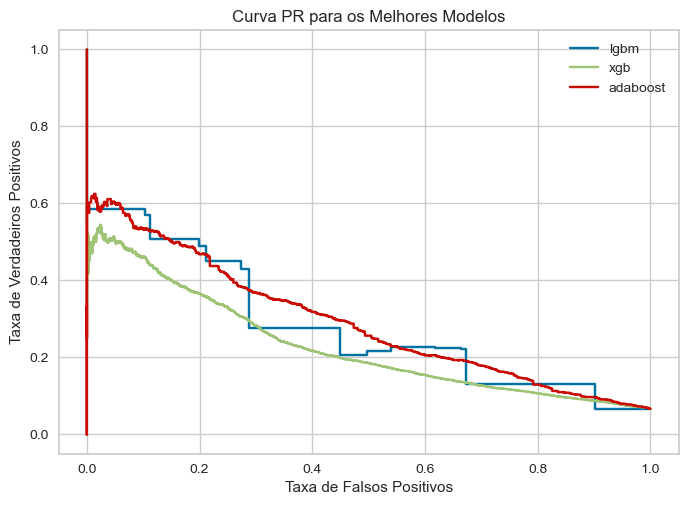

In [40]:
# Criar uma figura e eixos para o gráfico
fig, ax = plt.subplots()

# Percorrer o dicionário best_models e plotar as curvas ROC
for name, model in final_models.items():
    plot_precision_recall_curve(model.fit(X_train_processed, y_train), X_train_processed, y_train, ax=ax, label=name)

# Definir o título, rótulos dos eixos x e y
ax.set_title('Curva PR para os Melhores Modelos')
ax.set_xlabel('Taxa de Falsos Positivos')
ax.set_ylabel('Taxa de Verdadeiros Positivos')

# Adicionar uma legenda ao gráfico
ax.legend()

# Exibir o gráfico
plt.show()

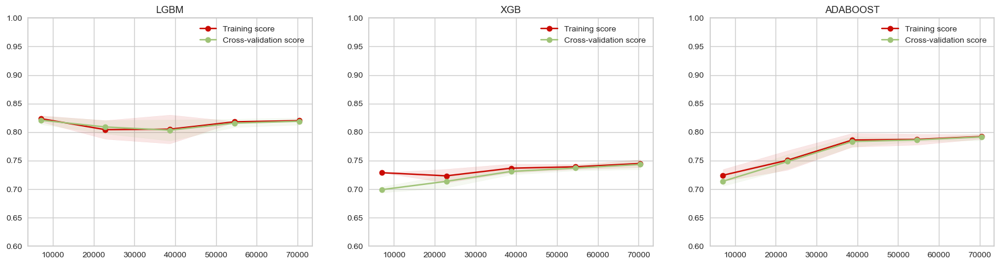

In [41]:
# Define uma função que plota múltiplas curvas de aprendizado para diferentes modelos de machine learning
def plot_multiple_learning_curves(models, X, y, train_sizes=np.linspace(.1, 1.0, 5)):
    # Cria uma figura com subplots para cada modelo
    fig, axes = plt.subplots(1, len(models), figsize=(len(models)*7, 5))

    for i, model in enumerate(models.keys()):
        # Cria uma curva de aprendizado para o modelo atual
        train_sizes, train_scores, test_scores = learning_curve(
            models[model], X, y, cv=StratifiedKFold(), n_jobs=-1, train_sizes=train_sizes, scoring='roc_auc')

        # Calcula as médias e desvios padrão dos scores de treino e validação para cada tamanho de conjunto de treinamento
        train_scores_mean = np.mean(train_scores, axis=1)
        train_scores_std = np.std(train_scores, axis=1)
        test_scores_mean = np.mean(test_scores, axis=1)
        test_scores_std = np.std(test_scores, axis=1)

        # Preenche a área entre as barras de erro das curvas de treino e validação com cores diferentes
        axes[i].grid()
        axes[i].fill_between(train_sizes, train_scores_mean - train_scores_std,
                             train_scores_mean + train_scores_std, alpha=0.1,
                             color="r")
        axes[i].fill_between(train_sizes, test_scores_mean - test_scores_std,
                             test_scores_mean + test_scores_std, alpha=0.1, color="g")
        # Plota as curvas de treino e validação
        axes[i].plot(train_sizes, train_scores_mean, 'o-', color="r",
                     label="Training score")
        axes[i].plot(train_sizes, test_scores_mean, 'o-', color="g",
                     label="Cross-validation score")
        # Adiciona legenda, título e configurações adicionais para cada subplot
        axes[i].legend(loc="best")
        axes[i].set_title(f"{model.upper()}")
        axes[i].set_ylim(0.6, 1)
        axes[i].grid()
        
    # Mostra o gráfico final
    plt.show()

# Chama a função para plotar curvas de aprendizado para os modelos finais, usando o conjunto de treinamento completo
plot_multiple_learning_curves(final_models, X_train_processed, y_train)

In [42]:
# Este loop salva cada modelo em um arquivo pickle com um timestamp no nome do arquivo
for name, model in best_models.items():
    now = datetime.datetime.now().strftime('%Y-%m-%d-%H-%M')
    with open(f'models/optuna_over_{name}_{now}.pkl', 'wb') as file:
        pickle.dump(model, file)

### 4.4 Over+Undersampling

- Nesta subseção, é aplicada a técnica de combinação de oversampling e undersampling utilizando o algoritmo SMOTEENN (SMOTE + Edited Nearest Neighbors).
- O objetivo é gerar novas instâncias sintéticas da classe minoritária e remover instâncias da classe majoritária para obter uma proporção de classes mais equilibrada.
- Cada modelo é ajustado nos dados resultantes da combinação do SMOTE e NearMiss, e seu desempenho é avaliado.

In [ ]:
# Define a métrica de avaliação como F2 score
f2_score = make_scorer(fbeta_score, beta=2)

# Define a função objetivo a ser minimizada pelo Optuna
def objective(trial):
     # Define hiperparâmetros a serem ajustados para o modelo
    model_name = trial.suggest_categorical('model', ['lgbm', 'xgb', 'adaboost'])

    if model_name == 'lgbm':
        params = {
            'num_leaves': trial.suggest_int('num_leaves', 2, 128),
            'max_depth': trial.suggest_int('max_depth', 2, 15),
            'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 0.1),
            'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'reg_alpha': trial.suggest_loguniform('reg_alpha', 0.001, 10.0),
            'reg_lambda': trial.suggest_loguniform('reg_lambda', 0.001, 10.0),
        }
        model = LGBMClassifier(**params)

    elif model_name == 'xgb':
        params = {
            'max_depth': trial.suggest_int('max_depth', 2, 15),
            'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 0.1),
            'gamma': trial.suggest_loguniform('gamma', 0.001, 10.0),
            'min_child_weight': trial.suggest_loguniform('min_child_weight', 0.001, 10.0),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'reg_alpha': trial.suggest_loguniform('reg_alpha', 0.001, 10.0),
            'reg_lambda': trial.suggest_loguniform('reg_lambda', 0.001, 10.0),
            'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        }
        model = XGBClassifier(**params)

    else:
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 50, 500),
            'learning_rate': trial.suggest_loguniform('learning_rate', 0.001, 0.1)
        }
        model = AdaBoostClassifier(**params)

    # Treinar o modelo com na pipeline de cross-validation
    steps = [('under', SMOTEENN()), ('model',model)]
    pipeline = imbPipeline(steps=steps)

    # Use cross_val_score para calcular o F2 score no conjunto de validação
    scores = cross_val_score(pipeline, X_train_processed, y_train, cv=StratifiedKFold(), scoring=f2_score)

    # Retorna a pontuação média
    return scores.mean()

# Execute o Optuna para encontrar os melhores hiperparâmetros para os três modelos
study = optuna.create_study(direction='maximize', sampler=TPESampler())
study.optimize(objective, n_trials=40)

lgbm
PR AUC: 0.257
ROC AUC: 0.742
xgb
PR AUC: 0.270
ROC AUC: 0.798
adaboost
PR AUC: 0.178
ROC AUC: 0.728


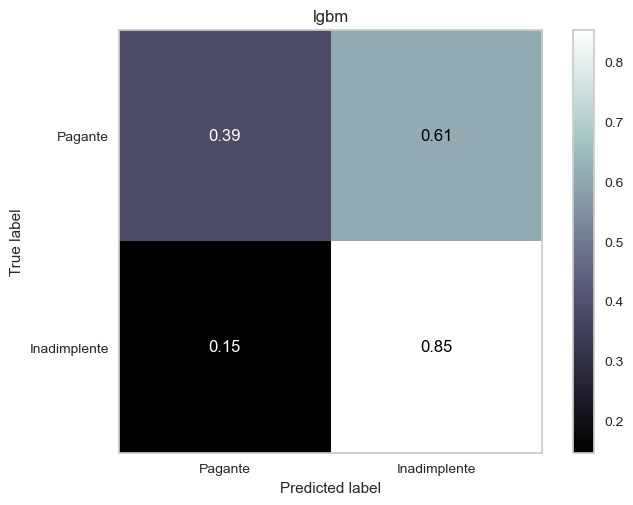

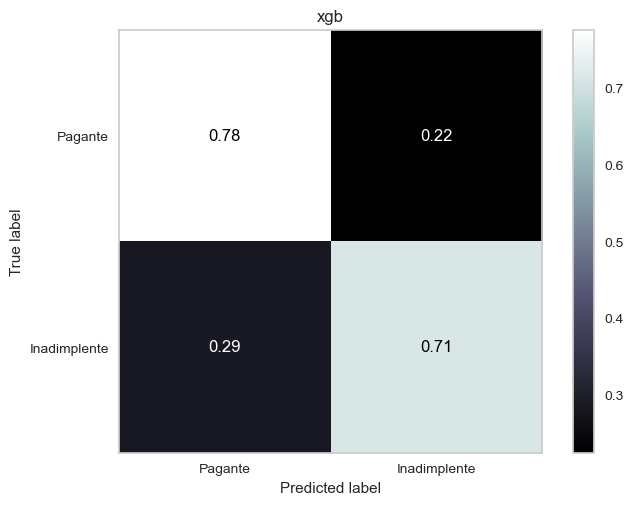

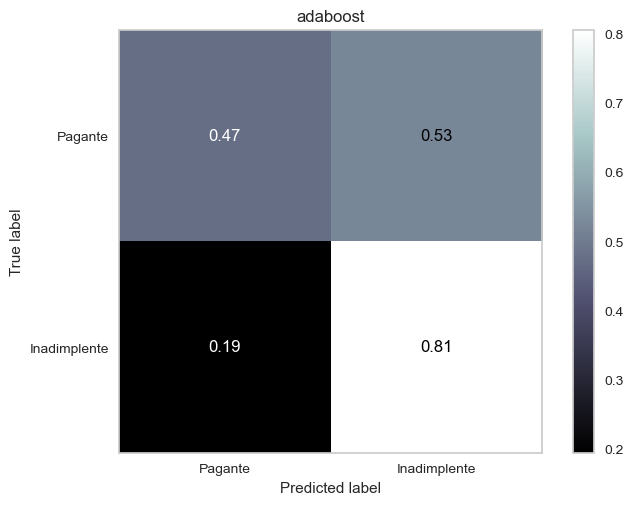

In [44]:
# Criar um dicionário com os melhores modelos para cada algoritmo
best_models = {}

for trial in study.trials:
    model_name = trial.params['model']
    score = trial.value
    params = trial.params
    if model_name not in best_models or score > best_models[model_name]['score']:
        del params['model']
        best_models[model_name] = {'score': score, 'params': params}

# Instanciar o melhor modelo para cada algoritmo com os seus respectivos melhores parâmetros
best_lgbm_model = LGBMClassifier(**best_models['lgbm']['params'])
best_xgb_model = XGBClassifier(**best_models['xgb']['params'])
best_adaboost_model = AdaBoostClassifier(**best_models['adaboost']['params'])

# Criar um dicionário com os modelos finais
final_models = {
    'lgbm': best_lgbm_model,
    'xgb': best_xgb_model,
    'adaboost': best_adaboost_model,
}

# Treinar os modelos finais no conjunto completo de treinamento e fazer previsões no conjunto de teste
for model_name, model in final_models.items():
    # Treinar o modelo no conjunto de treinamento completo
    steps = [('under', NearMiss()), ('model',model)]
    pipeline = imbPipeline(steps=steps)
    pipeline.fit(X_train_processed, y_train)
    final_models[model_name] = pipeline

    # Fazer previsões para o conjunto de teste
    y_pred = pipeline.predict(X_test_processed)
    y_pred_proba = pipeline.predict_proba(X_test_processed)[:,1]

    # Calcular as métricas PR AUC e ROC AUC
    precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
    roc_auc = roc_auc_score(y_test, y_pred_proba)
    auc_score = auc(recall, precision)
    print(model_name)
    print('PR AUC: %.3f' % auc_score)
    print('ROC AUC: %.3f' % roc_auc)

    # Plotar a matriz de confusão normalizada para o conjunto de teste
    ConfusionMatrixDisplay.from_predictions(y_test, y_pred, cmap='bone', display_labels=['Pagante','Inadimplente'], normalize='true')
    plt.title(model_name)
    plt.grid(False)


In [45]:
# Faça um loop através do dicionário best_models e plote os relatórios de classificação desbalanceada da bibliotrca imblearn
for nome, modelo in final_models.items():
    # Fit do pipeline no conjunto de treinamento completo
    modelo.fit(X_train_processed, y_train)

    # Predição da variável-alvo no conjunto de teste
    y_pred = modelo.predict(X_test_processed)

    # Imprimir o relatório de classificação
    print(nome)
    print(classification_report_imbalanced(y_test,y_pred))

lgbm
                   pre       rec       spe        f1       geo       iba       sup

          0       0.97      0.39      0.85      0.56      0.58      0.32     20534
          1       0.09      0.85      0.39      0.16      0.58      0.35      1466

avg / total       0.92      0.42      0.82      0.53      0.58      0.32     22000

xgb
                   pre       rec       spe        f1       geo       iba       sup

          0       0.97      0.78      0.71      0.86      0.74      0.56     20534
          1       0.18      0.71      0.78      0.29      0.74      0.55      1466

avg / total       0.92      0.77      0.72      0.83      0.74      0.56     22000

adaboost
                   pre       rec       spe        f1       geo       iba       sup

          0       0.97      0.47      0.81      0.64      0.62      0.37     20534
          1       0.10      0.81      0.47      0.18      0.62      0.40      1466

avg / total       0.91      0.50      0.78      0.61      0.6

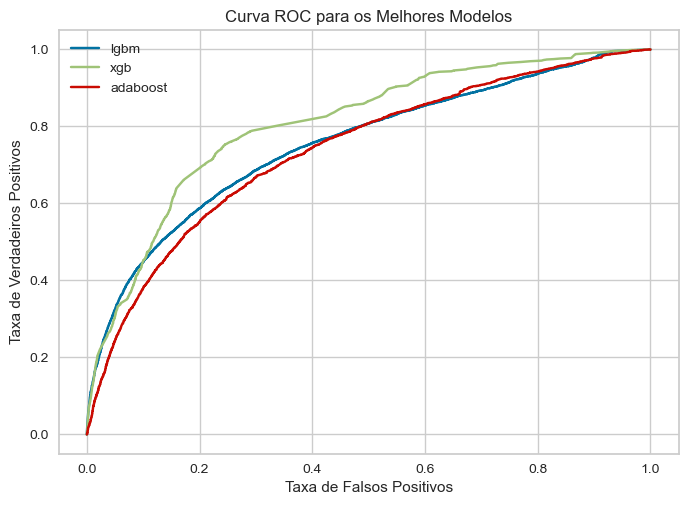

In [46]:
# Criar uma figura e eixos para o gráfico
fig, ax = plt.subplots()

# Percorrer o dicionário best_models e plotar as curvas ROC
for name, model in final_models.items():
    plot_roc_curve(model.fit(X_train_processed, y_train), X_train_processed, y_train, ax=ax, label=name)

# Definir o título, rótulos dos eixos x e y
ax.set_title('Curva ROC para os Melhores Modelos')
ax.set_xlabel('Taxa de Falsos Positivos')
ax.set_ylabel('Taxa de Verdadeiros Positivos')

# Adicionar uma legenda ao gráfico
ax.legend()

# Exibir o gráfico
plt.show()

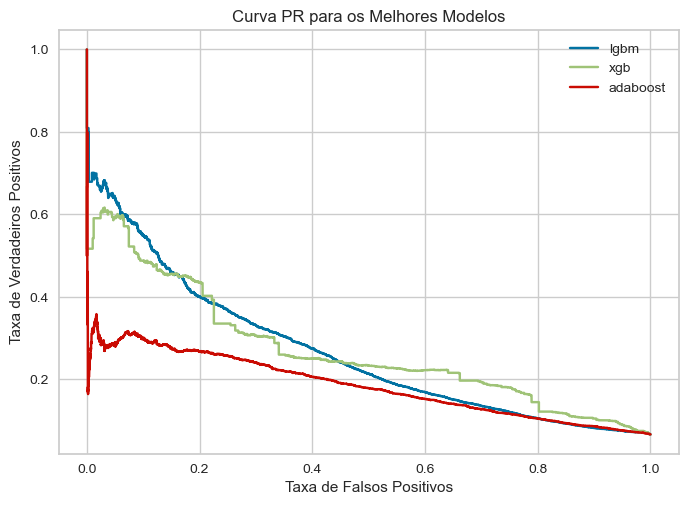

In [47]:
# Criar uma figura e eixos para o gráfico
fig, ax = plt.subplots()

# Percorrer o dicionário best_models e plotar as curvas ROC
for name, model in final_models.items():
    plot_precision_recall_curve(model.fit(X_train_processed, y_train), X_train_processed, y_train, ax=ax, label=name)

# Definir o título, rótulos dos eixos x e y
ax.set_title('Curva PR para os Melhores Modelos')
ax.set_xlabel('Taxa de Falsos Positivos')
ax.set_ylabel('Taxa de Verdadeiros Positivos')

# Adicionar uma legenda ao gráfico
ax.legend()

# Exibir o gráfico

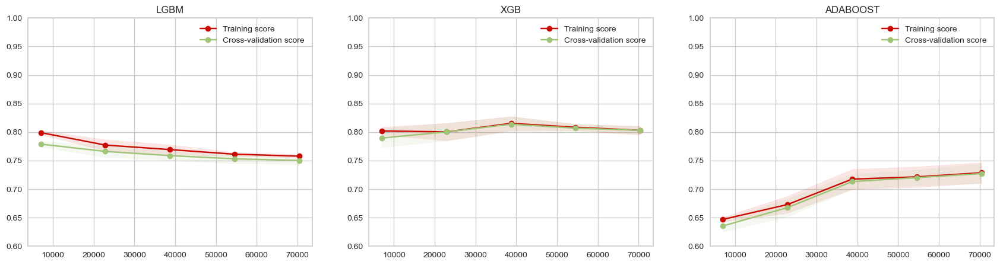

In [48]:
# Define uma função que plota múltiplas curvas de aprendizado para diferentes modelos de machine learning
def plot_multiple_learning_curves(models, X, y, train_sizes=np.linspace(.1, 1.0, 5)):
    # Cria uma figura com subplots para cada modelo
    fig, axes = plt.subplots(1, len(models), figsize=(len(models)*7, 5))

    for i, model in enumerate(models.keys()):
        # Cria uma curva de aprendizado para o modelo atual
        train_sizes, train_scores, test_scores = learning_curve(
            models[model], X, y, cv=StratifiedKFold(), n_jobs=-1, train_sizes=train_sizes, scoring='roc_auc')

        # Calcula as médias e desvios padrão dos scores de treino e validação para cada tamanho de conjunto de treinamento
        train_scores_mean = np.mean(train_scores, axis=1)
        train_scores_std = np.std(train_scores, axis=1)
        test_scores_mean = np.mean(test_scores, axis=1)
        test_scores_std = np.std(test_scores, axis=1)

        # Preenche a área entre as barras de erro das curvas de treino e validação com cores diferentes
        axes[i].grid()
        axes[i].fill_between(train_sizes, train_scores_mean - train_scores_std,
                             train_scores_mean + train_scores_std, alpha=0.1,
                             color="r")
        axes[i].fill_between(train_sizes, test_scores_mean - test_scores_std,
                             test_scores_mean + test_scores_std, alpha=0.1, color="g")
        # Plota as curvas de treino e validação
        axes[i].plot(train_sizes, train_scores_mean, 'o-', color="r",
                     label="Training score")
        axes[i].plot(train_sizes, test_scores_mean, 'o-', color="g",
                     label="Cross-validation score")
        # Adiciona legenda, título e configurações adicionais para cada subplot
        axes[i].legend(loc="best")
        axes[i].set_title(f"{model.upper()}")
        axes[i].set_ylim(0.6, 1)
        axes[i].grid()
        
    # Mostra o gráfico final
    plt.show()

# Chama a função para plotar curvas de aprendizado para os modelos finais, usando o conjunto de treinamento completo
plot_multiple_learning_curves(final_models, X_train_processed, y_train)

In [49]:
# Este loop salva cada modelo em um arquivo pickle com um timestamp no nome do arquivo
for name, model in best_models.items():
    now = datetime.datetime.now().strftime('%Y-%m-%d-%H-%M')
    with open(f'models/optuna_overunder_{name}_{now}.pkl', 'wb') as file:
        pickle.dump(model, file)

## 5. Resultados e Avaliação

O objetivo desta seção é treinar e avaliar diferentes modelos (LGBM, XGB e ADA) utilizando os melhores hiperparâmetros encontrados para cada um. Em seguida, compará-los em diferentes métricas de avaliação voltadas para dados desbalanceados.

Com base nas conclusões desta seção e da seção anterior, será possível escolher o modelo que apresenta a melhor capacidade de generalização e equilíbrio entre viés e variância. Esse modelo será utilizado para prever as instâncias não classificadas do conjunto de dados de teste.

As etapas são:

- Utilizar a função open_params() para abrir os arquivos com os hiperparâmetros dos melhores modelos de cada técnica de amostragem para cada modelo (LGBM, XGB e ADA);
- Utilizar a função split_data() para dividir os dados em treino e teste;
- Utilizar a classe Preprocessor() para pré-processar os dados;
- Calcular o peso das classes para a técnica de amostragem com pesos;
- Definir os modelos com os melhores hiperparâmetros encontrados para cada técnica de amostragem e treiná-los e avaliá-los;
- Calcular as métricas de avaliação e armazenar os resultados na variável "results";
- Criar um dataframe com os resultados, destacando os melhores desempenhos.
-  Realizar o ajuste fino de hiperparâmetros dos melhores modelos

### 5.1 Tabulação dos resultados finais

In [43]:
def open_params(path):
    # Abre o arquivo com os parâmetros
    with open(path, 'rb') as f:
        # Carrega o objeto do arquivo
        obj = pickle.load(f)['params']

    return obj

# Dicionário com os melhores parâmetros para cada modelo e técnica de amostragem
best_params = {
    'lgbm': {
        'pesos':open_params('models\optuna_imbalanced_lgbm_2023-02-19-23-19.pkl'),
        'under':open_params('models\optuna_under_lgbm_2023-02-20-00-30.pkl'),
        'over':open_params('models\optuna_under_lgbm_2023-02-20-02-06.pkl'),
        'overunder':open_params('models\optuna_under_lgbm_2023-02-20-03-25.pkl'),
    },
    'xgb': {
        'pesos':open_params('models\optuna_imbalanced_xgb_2023-02-19-23-19.pkl'),
        'under':open_params('models\optuna_under_xgb_2023-02-20-00-30.pkl'),
        'over':open_params('models\optuna_under_xgb_2023-02-20-02-06.pkl'),
        'overunder':open_params('models\optuna_under_xgb_2023-02-20-03-25.pkl'),
    },
    'ada': {
        'pesos':open_params('models\optuna_imbalanced_adaboost_2023-02-19-23-19.pkl'),
        'under':open_params('models\optuna_under_adaboost_2023-02-20-00-30.pkl'),
        'over':open_params('models\optuna_under_adaboost_2023-02-20-02-06.pkl'),
        'overunder':open_params('models\optuna_under_adaboost_2023-02-20-03-25.pkl'),
    },
}

# Dicionário com os parâmetros verdadeiros
true_params = {}
for model in best_params.keys():
    true_params[model] = {}
    for sampling in best_params[model].keys():
        true_params[model][sampling] = best_params[model][sampling]


In [25]:
# Divisão dos dados em treino e teste
X_train, y_train, X_test, y_test, _, _, _, _ = split_data(treino, 2023)

# Pré-processamento dos dados
preprocessor = Preprocessor()
X_train_processed = preprocessor.fit_transform(X_train)
X_test_processed = preprocessor.transform(X_test)

# Cálculo do peso das classes
sample_weight = (y_train == 0).sum() / (y_train == 1).sum()

Treino: 66000 Validação: 22000 Teste: 22000


In [65]:
# Definir modelos e seus parâmetros
models = {
    'lgbm': LGBMClassifier(),
    'xgb': XGBClassifier(),
    'ada': AdaBoostClassifier(),
}

# Treinar e avaliar modelos com os melhores parâmetros
results = {}
best_models = {}
for model_name, model in models.items():
    for sampling in ['pesos', 'under', 'over', 'overunder']:
        if sampling == 'pesos':
            if model_name == 'xgb':
                model.set_params(**true_params[model_name]['pesos'],scale_pos_weight = (y_train == 0).sum() / (y_train == 1).sum())
                model.fit(X_train_processed, y_train)
                y_pred = model.predict(X_test_processed)
                best_models[f'{model_name}_{sampling}'] = model  
            elif model_name == 'lgbm':
                model.set_params(**true_params[model_name]['pesos'],is_unbalance=True)
                model.fit(X_train_processed, y_train)
                y_pred = model.predict(X_test_processed)
                best_models[f'{model_name}_{sampling}'] = model
            elif model_name == 'ada':
                model.set_params(**true_params[model_name]['pesos'])
                model.fit(X_train_processed, y_train)
                y_pred = model.predict(X_test_processed)
                best_models[f'{model_name}_{sampling}'] = model                
        elif sampling == 'under':
            model.set_params(**true_params[model_name]['under'])
            steps = [('under', NearMiss()), ('model',model)]
            pipeline = imbPipeline(steps=steps)
            pipeline.fit(X_train_processed, y_train)
            y_pred = pipeline.predict(X_test_processed)
            best_models[f'{model_name}_{sampling}'] = pipeline
        elif sampling == 'over':
            model.set_params(**true_params[model_name]['over'])
            steps = [('over', SMOTE()), ('model',model)]
            pipeline = imbPipeline(steps=steps)
            pipeline.fit(X_train_processed, y_train)
            y_pred = pipeline.predict(X_test_processed)
            best_models[f'{model_name}_{sampling}'] = pipeline
        else:
            model.set_params(**true_params[model_name]['overunder'])
            steps = [('over', SMOTEENN()), ('model',model)]
            pipeline = imbPipeline(steps=steps)
            pipeline.fit(X_train_processed, y_train)
            y_pred = pipeline.predict(X_test_processed)
            best_models[f'{model_name}_{sampling}'] = pipeline
        
        # Calcular métricas de avaliação
        roc_auc = roc_auc_score(y_test, y_pred)
        pr_auc = average_precision_score(y_test, y_pred)
        report = classification_report_imbalanced(y_test, y_pred, output_dict=True)
        report['roc_auc'] = roc_auc
        report['pr_auc'] = pr_auc
        
        # Armazenar resultados
        results[(model_name, sampling)] = report

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


In [66]:
def get_avg_df(data_dict):
    # Cria um dicionário vazio para armazenar os valores médios
    avg_dict = {}
    
    # Itera sobre as chaves e valores no dicionário de dados
    for key, value in data_dict.items():
        # Extrai os valores médios
        avg_dict[key] = {k:v for k, v in value.items()}
    
    # Converte o dicionário de médias em um DataFrame
    avg_df = pd.DataFrame(avg_dict).T
    
    # Retorna uma tabela estilizada do DataFrame com a maior pontuação destacada
    return avg_df.iloc[:,2:].drop('total_support', axis=1).style.highlight_max()

# Obtém um DataFrame das médias dos resultados
get_avg_df(results)

Os modelos que obtiveram os melhores resultados nas métricas ROC AUC e PR AUC são, respectivamente, o modelo LGBM com pesos de classes e o modelo XGBoost, também com pesos de classes.

Além disso, também obtiveram resultados nas métricas voltadas para dados desbalanceados: IBA (Index Balanced Accuracy) e GEO (raiz do produto da taxa entre verdadeiros e falsos de cada classe) e F1 (média harmôncia entre precisão e recall).

Esses modelos também apresentaram um bom desempenho nas curvas de aprendizado, com baixa variância dentro e entre cada conjunto de dados.

Portanto são os modelos para os quais será feiro o ajuste fino de hiperparâmetros (fine tuning).

### 5.2 Hyperparameter Finetuning

Nesta subseção o objetivo é encontrar o melhor conjunto de hiperparâmetros para cada modelo e comparar seus desempenhos finais. O modelo que apresentar melhor desempenho em todas as métricas será utilizado para fazer a classificação dos exemplos do conjunto de dados de submissão.

Neste contexto, serão seguidas as etapas:

- Optimizar os hiperparâmetros de cada modelo utilizando os conjuntos de treino e validação
- Utilizar os modelos otimizados para prever os exemplos do conjunto de dados de teste
- Avaliar a capacidade de generalização de cada modelo, utilizando:
    - Matrizes de confusão
    - Curvas ROC
    - Curva de aprendizado
    - Importância de atributos
    - Gráficos SHAP
    - Metricas de avalição voltadas para classes desbalanceadas (ROC AUC, PR ROC, F1, GEO, IBA, etc)

In [44]:
# Reamostrando o conjunto de dados
X_full_train, y_full_train, X_test, y_test, X_train, y_train, X_val, y_val = split_data(treino)

Treino: 66000 Validação: 22000 Teste: 22000


In [45]:
# Criando uma instância da classe Preprocessor que definimos anteriormente
preprocessor = Preprocessor()

# Aplicando o pré-processamento aos dados de treino usando o método fit_transform da instância preprocessor
X_train_processed = preprocessor.fit_transform(X_train)

# Aplicando o pré-processamento aos dados de teste usando o método transform da instância preprocessor
X_test_processed = preprocessor.transform(X_test)
X_val_processed = preprocessor.transform(X_val)

# Calculando o peso da amostra (sample_weight) para ser usado em um modelo de aprendizado de máquina. A fórmula usada aqui é a razão entre o número de exemplos negativos e o número de exemplos positivos no conjunto de treino.
sample_weight = (y_train == 0).sum() / (y_train == 1).sum()

5.2.1 LightGBM

In [62]:
# Define a função objetivo a ser minimizada pelo Optuna
def objective(trial):
    params = {
        "objective": "binary",
        'random_state': 42,
         'metric': 'auc',
        "verbosity": -1,
        "boosting_type": "gbdt",
        #"device": "gpu",
        "learning_rate": trial.suggest_float("learning_rate",0.005 ,0.2),
        "n_estimators" : trial.suggest_int("n_estimators" , 1000 , 10000),
        "lambda_l1": trial.suggest_float("lambda_l1", 1e-8, 10.0, log=True),
        "lambda_l2": trial.suggest_float("lambda_l2", 1e-8, 10.0, log=True),
        "num_leaves": trial.suggest_int("num_leaves", 2, 256),
        "feature_fraction": trial.suggest_float("feature_fraction", 0.4, 1.0),
        "bagging_fraction": trial.suggest_float("bagging_fraction", 0.4, 1.0),
        "bagging_freq": trial.suggest_int("bagging_freq", 1, 7),
        "min_child_samples": trial.suggest_int("min_child_samples", 5, 100),
    }
    model = LGBMClassifier(**params, is_unbalance=True)
    
    # model.fit( X_train_processed, y_train,
              #eval_set=[(X_val_processed, y_val)],
              #early_stopping_rounds=100,
              #verbose=False
              #)

    final_auc = cross_val_score(model, X_train_processed, y_train, cv=StratifiedKFold(), scoring='roc_auc', n_jobs=-1).mean()   
    return final_auc    

# Execute o Optuna para encontrar os melhores hiperparâmetros para os três modelos
study = optuna.create_study(direction='maximize', sampler=TPESampler())
study.optimize(objective, n_trials=30)
lgmb_best_params = study.best_params

[I 2023-02-21 22:12:57,205] A new study created in memory with name: no-name-65fcca79-c78b-420b-a1bb-96f191ef29ec
[I 2023-02-21 22:15:26,834] Trial 0 finished with value: 0.5241868775167443 and parameters: {'learning_rate': 0.18177848376323488, 'n_estimators': 8403, 'lambda_l1': 1.0185036327205079e-07, 'lambda_l2': 0.0004016142635390947, 'num_leaves': 219, 'feature_fraction': 0.5918184221418776, 'bagging_fraction': 0.7704403813827512, 'bagging_freq': 2, 'min_child_samples': 6}. Best is trial 0 with value: 0.5241868775167443.
[I 2023-02-21 22:19:01,558] Trial 1 finished with value: 0.6892997236406782 and parameters: {'learning_rate': 0.12706618857622162, 'n_estimators': 6886, 'lambda_l1': 0.026187543705891957, 'lambda_l2': 0.003713456222666606, 'num_leaves': 213, 'feature_fraction': 0.9847931285355197, 'bagging_fraction': 0.4335632483641145, 'bagging_freq': 5, 'min_child_samples': 39}. Best is trial 1 with value: 0.6892997236406782.
[I 2023-02-21 22:25:03,875] Trial 2 finished with valu

[LightGBM] [Warning] feature_fraction is set=0.469149345625174, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.469149345625174
[LightGBM] [Warning] lambda_l1 is set=0.005463294159787981, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005463294159787981
[LightGBM] [Warning] bagging_fraction is set=0.5081514436958949, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5081514436958949
[LightGBM] [Warning] lambda_l2 is set=0.00030086271030418135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00030086271030418135
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
                   pre       rec       spe        f1       geo       iba       sup

          0       0.96      0.93      0.42      0.94      0.62      0.41     20534
          1       0.31      0.42      0.93      0.35      0.62      0.37      1466

avg / total       0.91      0.90      0.45      0.91      0.62 

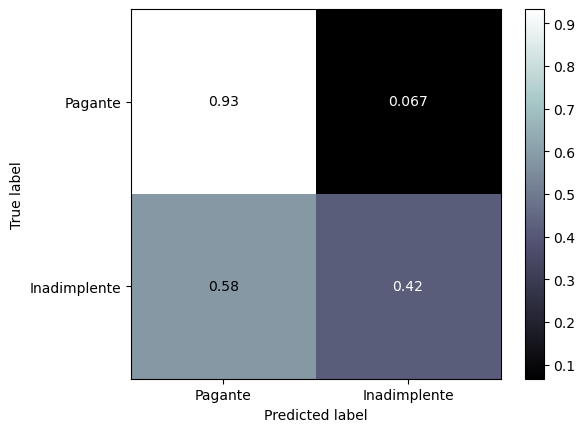

In [ ]:
# Treinar o modelo no conjunto de treinamento completo
model = LGBMClassifier(**lgmb_best_params, is_unbalance=True)
X_full_train_processed = preprocessor.fit_transform(X_full_train)
model.fit(X_full_train_processed, y_full_train)
y_pred = model.predict(X_test_processed)

# Plotar a matriz de confusão normalizada para o conjunto de teste
print(classification_report_imbalanced(y_test, y_pred))
print(roc_auc_score(y_test, y_pred))
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, cmap='bone', display_labels=['Pagante','Inadimplente'], normalize='true')
plt.grid(False)

In [ ]:
# Usando o método GHOST de escolha do limiar de decisão
train_probs = model.predict_proba(X_full_train_processed)[:,1]
thresholds = np.round(np.arange(0.01, 0.99, 0.01),2)
threshold_lgbm = ghostml.optimize_threshold_from_predictions(y_full_train, train_probs, thresholds, ThOpt_metrics = 'ROC') 
print(threshold_lgbm)

0.5


                   pre       rec       spe        f1       geo       iba       sup

          0       0.98      0.80      0.75      0.88      0.77      0.60     20534
          1       0.21      0.75      0.80      0.33      0.77      0.59      1466

avg / total       0.93      0.79      0.75      0.84      0.77      0.60     22000



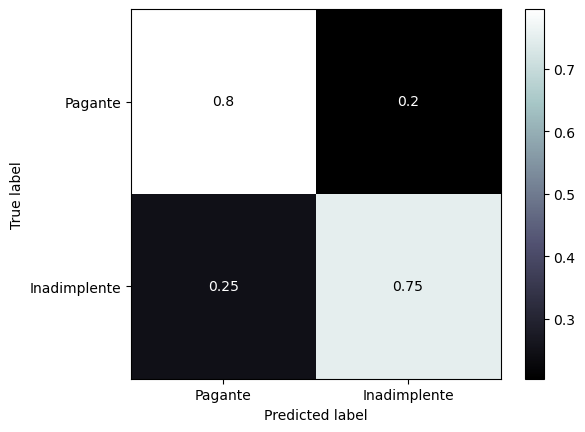

In [ ]:
# Fazer previsões para o conjunto de teste
y_pred = (model.predict_proba(X_test_processed)[:,1] > threshold_lgbm).astype('int')

# Plotar a matriz de confusão normalizada para o conjunto de teste
print(classification_report_imbalanced(y_test, y_pred))
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, cmap='bone', display_labels=['Pagante','Inadimplente'], normalize='true')
plt.grid(False)

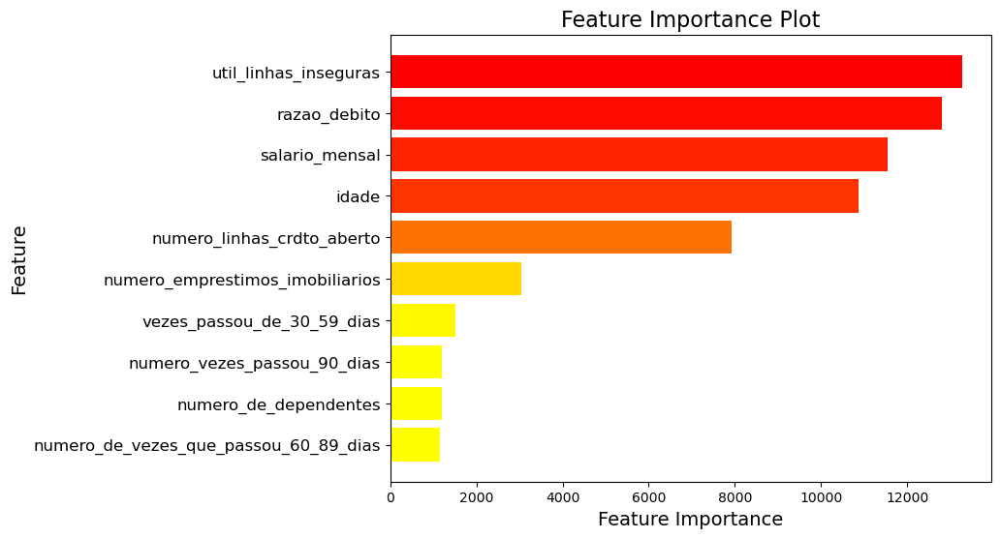

In [ ]:
import matplotlib.colors as mcolors

def plot_feature_importance(model, feature_names, max_num_features=None):
    importance = model.feature_importances_
    tuples = [(feature_names[i], importance[i]) for i in range(len(importance))]
    tuples = sorted(tuples, key=lambda x: x[1], reverse=False)

    if max_num_features:
        tuples = tuples[:max_num_features]

    sorted_names = [t[0] for t in tuples]
    sorted_scores = [t[1] for t in tuples]

    # Create a color map for the bars
    cmap = mcolors.LinearSegmentedColormap.from_list('mycmap', ['yellow', 'red'])

    # Scale the scores to [0, 1] and map them to the color map
    norm = mcolors.Normalize(vmin=min(sorted_scores), vmax=max(sorted_scores))
    colors = [cmap(norm(score)) for score in sorted_scores]

    # Plot the bars horizontally
    plt.figure(figsize=(8, 6))
    plt.barh(range(len(sorted_scores)), sorted_scores, color=colors)
    plt.yticks(range(len(sorted_names)), sorted_names, fontsize=12)
    plt.xlabel("Feature Importance", fontsize=14)
    plt.ylabel("Feature", fontsize=14)
    plt.title("Feature Importance Plot", fontsize=16)

plot_feature_importance(model, list(X_test_processed))

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


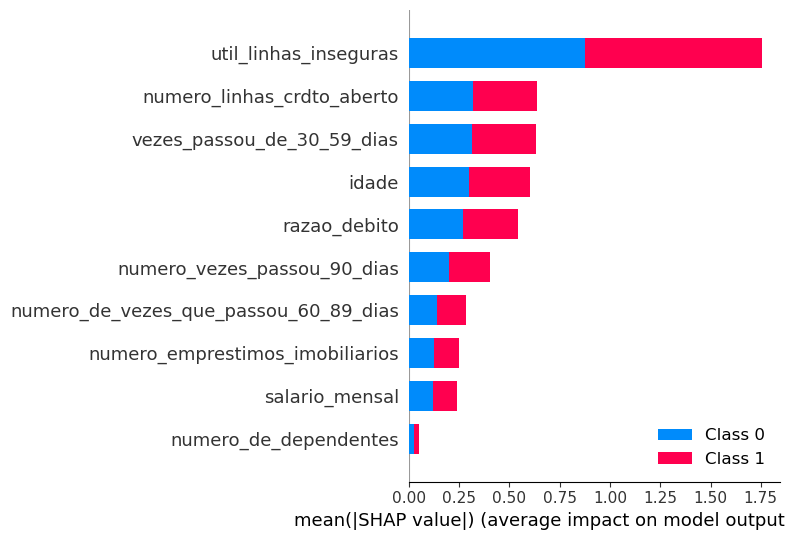

In [ ]:
import matplotlib.colors as mcolors

def plot_feature_importance(model, feature_names, max_num_features=None):
    # Extrai a importância das características a partir do modelo
    importance = model.feature_importances_
    tuples = [(feature_names[i], importance[i]) for i in range(len(importance))]
    tuples = sorted(tuples, key=lambda x: x[1], reverse=False)

    # Limita o número de características exibidas se `max_num_features` for fornecido
    if max_num_features:
        tuples = tuples[:max_num_features]

    sorted_names = [t[0] for t in tuples]
    sorted_scores = [t[1] for t in tuples]

    # Cria um mapa de cores para as barras
    cmap = mcolors.LinearSegmentedColormap.from_list('mycmap', ['yellow', 'red'])

    # Escala as pontuações entre [0, 1] e as mapeia para o mapa de cores
    norm = mcolors.Normalize(vmin=min(sorted_scores), vmax=max(sorted_scores))
    colors = [cmap(norm(score)) for score in sorted_scores]

    # Plota as barras horizontalmente
    plt.figure(figsize=(8, 6))
    plt.barh(range(len(sorted_scores)), sorted_scores, color=colors)
    plt.yticks(range(len(sorted_names)), sorted_names, fontsize=12)
    plt.xlabel("Importância da característica", fontsize=14)
    plt.ylabel("Característica", fontsize=14)
    plt.title("Gráfico de importância de características", fontsize=16)

# Chama a função com o modelo e as características
plot_feature_importance(model, list(X_test_processed))

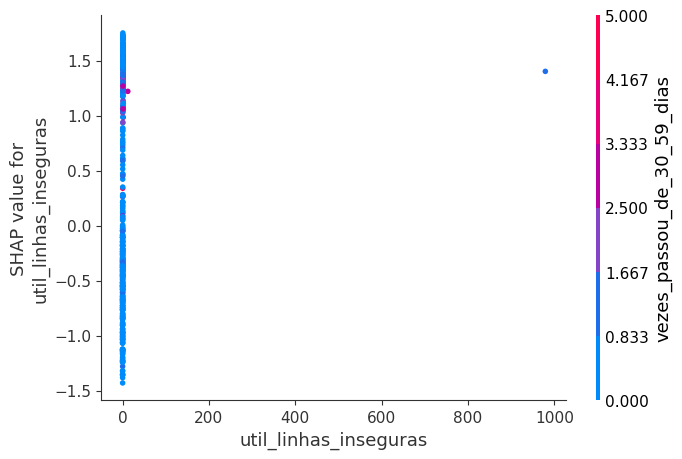

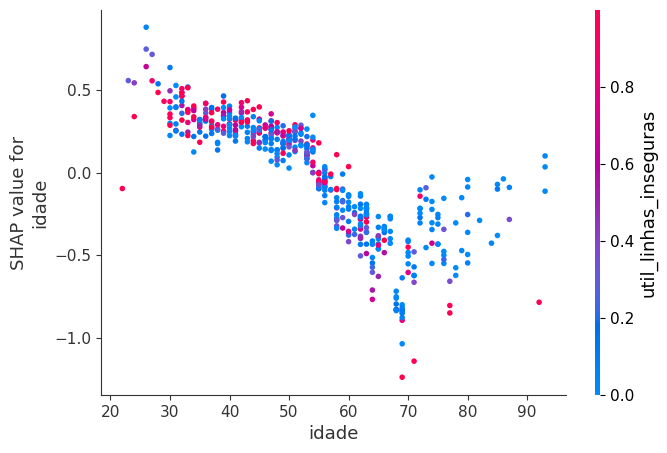

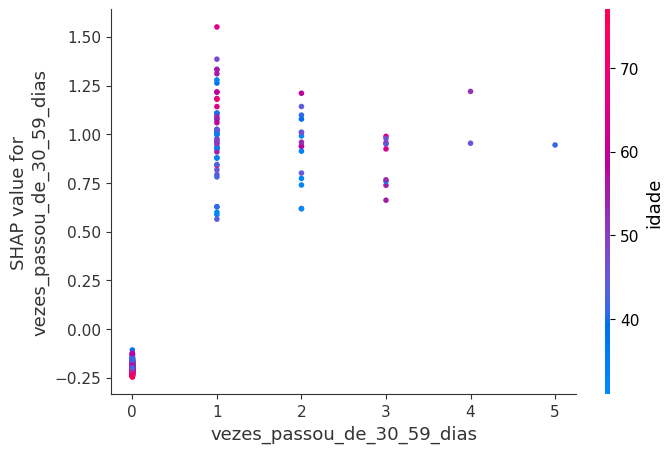

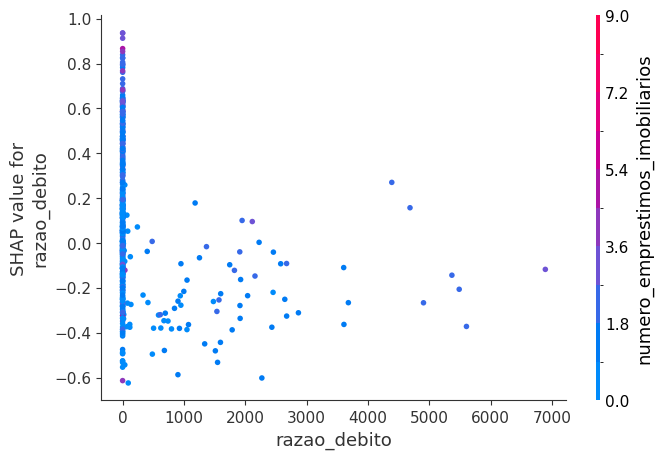

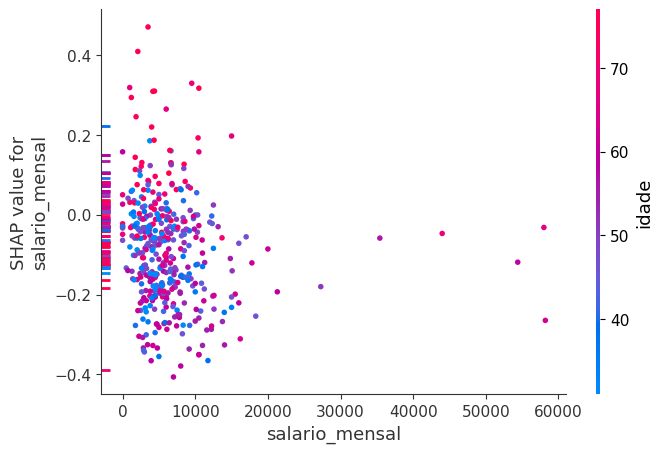

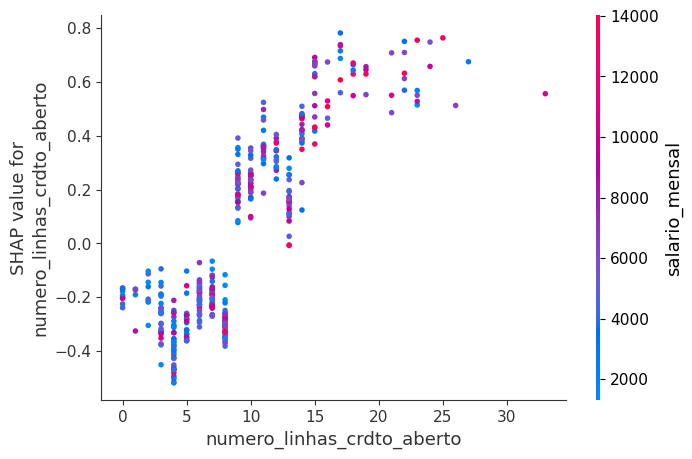

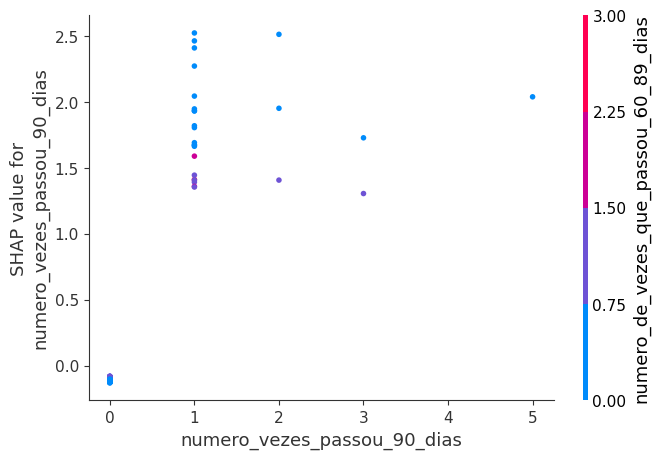

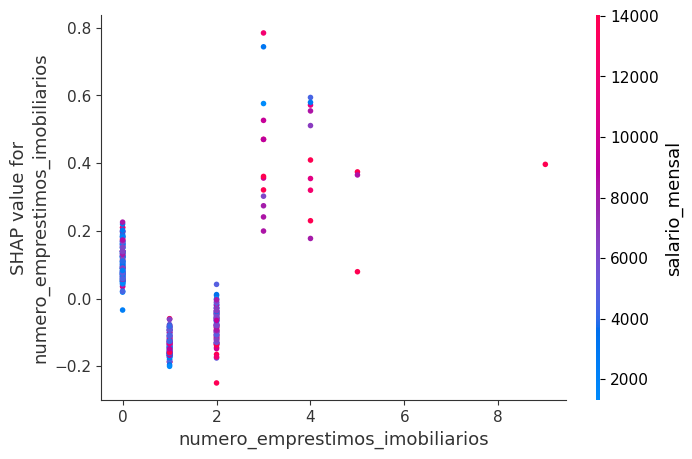

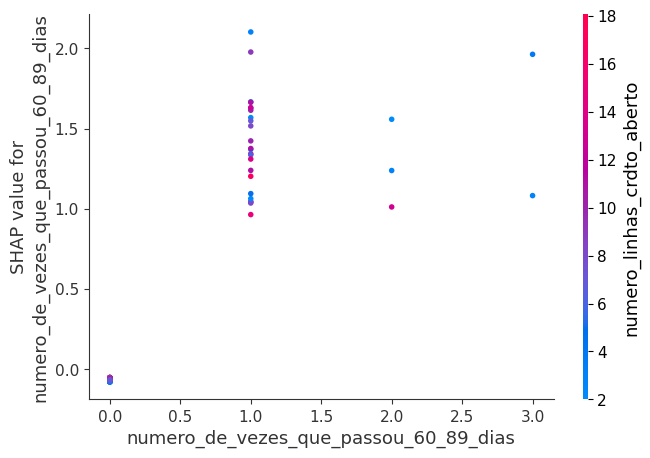

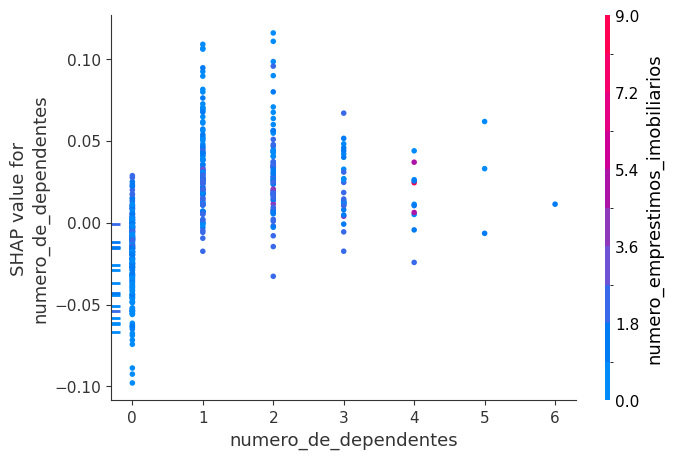

In [ ]:
for name in X_train.columns:
    shap.dependence_plot(name, shap_values, X_train_sampled)

5.2.2 XGBoost

In [ ]:
def objective_xgbr(trial, X=X_train_processed, y=y_train):
    
    # Divida os dados em conjuntos de treinamento e teste
    X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.25, random_state=42, shuffle=True) 
    
    # Defina os hiperparâmetros para otimização
    param = {   
        "verbosity": 0,
        "objective": "binary:logistic",
        "eval_metric": "auc",
        'random_state': 48,
        "booster": trial.suggest_categorical("booster", ["gbtree", "gblinear", "dart"]), # Define o tipo de booster
        "lambda": trial.suggest_float("lambda", 1e-8, 1.0, log=True), # Define a penalidade L2
        "alpha": trial.suggest_float("alpha", 1e-8, 1.0, log=True), # Define a penalidade L1
        "subsample": trial.suggest_float("subsample", 0.2, 1.0), # Define a taxa de amostragem de linhas
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.2, 1.0), # Define a taxa de amostragem de colunas
        "learning_rate": trial.suggest_float("learning_rate", 0.005, 0.2), # Define a taxa de aprendizagem
        "n_estimators": trial.suggest_int("n_estimators", 1000, 10000), # Define o número de estimadores
    }
    
    if param["booster"] in ["gbtree", "dart"]:
        # Define a profundidade máxima da árvore
        param["max_depth"] = trial.suggest_int("max_depth", 3, 9, step=2)
        # Define o peso mínimo da amostra
        param["min_child_weight"] = trial.suggest_int("min_child_weight", 2, 10)
        param["eta"] = trial.suggest_float("eta", 1e-8, 1.0, log=True) # Define a taxa de aprendizagem
        param["gamma"] = trial.suggest_float("gamma", 1e-8, 1.0, log=True) # Define o parâmetro de regularização gamma
        param["grow_policy"] = trial.suggest_categorical("grow_policy", ["depthwise", "lossguide"]) # Define a política de crescimento
        
    if param["booster"] == "dart":
        param["sample_type"] = trial.suggest_categorical("sample_type", ["uniform", "weighted"]) # Define o tipo de amostragem
        param["normalize_type"] = trial.suggest_categorical("normalize_type", ["tree", "forest"]) # Define o tipo de normalização
        param["rate_drop"] = trial.suggest_float("rate_drop", 1e-8, 1.0, log=True) # Define a taxa de queda
        param["skip_drop"] = trial.suggest_float("skip_drop", 1e-8, 1.0, log=True) # Define a taxa de saltos
        
    # Crie o modelo XGBClassifier
    model  = XGBClassifier(**param, scale_pos_weight=sample_weight)

    # Treine o modelo com o early-stopping
    model.fit(X_train, y_train,
              eval_set=[(X_test, y_test)],
              early_stopping_rounds=100,
              verbose=False) 

    # Calcule o AUC na validação cruza estratificada
    final_auc = roc_auc_score(y_val, model.predict(X_val_processed))   
    return final_auc    

# Execute o Optuna para encontrar os melhores hiperparâmetros para os três modelos
study_xgb = optuna.create_study(direction='maximize', sampler=TPESampler())
study_xgb.optimize(objective, n_trials=30)  

In [ ]:
xgb_best_params = study_xgb.best_params
xgb_best_params

{'booster': 'gbtree',
 'lambda': 7.747435442383709e-08,
 'alpha': 0.17906971668527763,
 'subsample': 0.6948543946129678,
 'colsample_bytree': 0.6510872832746522,
 'learning_rate': 0.018691524891698216,
 'n_estimators': 2997,
 'max_depth': 3,
 'min_child_weight': 7,
 'eta': 0.18335026527195547,
 'gamma': 0.00043390127242962426,
 'grow_policy': 'lossguide'}

                   pre       rec       spe        f1       geo       iba       sup

          0       0.98      0.80      0.75      0.88      0.77      0.60     20534
          1       0.21      0.75      0.80      0.33      0.77      0.59      1466

avg / total       0.93      0.79      0.75      0.84      0.77      0.60     22000

0.7733877902034771


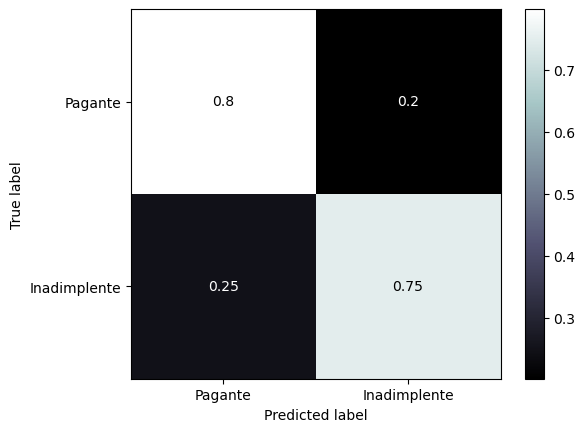

In [ ]:
model = XGBClassifier(**xgb_best_params,
              scale_pos_weight = sample_weight)

model.fit(X_full_train_processed, y_full_train)
y_pred = model.predict(X_test_processed)

# Plotar a matriz de confusão normalizada para o conjunto de teste
print(classification_report_imbalanced(y_test, y_pred))
print(roc_auc_score(y_test, y_pred))
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, cmap='bone', display_labels=['Pagante','Inadimplente'], normalize='true')
plt.grid(False)

In [ ]:
# Usando o método GHOST de escolha do limiar de decisão
train_probs = model.predict_proba(X_full_train_processed)[:,1]
thresholds = np.round(np.arange(0.01, 0.99, 0.01),2)
threshold = ghostml.optimize_threshold_from_predictions(y_full_train, train_probs, thresholds, ThOpt_metrics = 'ROC') 
print(threshold)

0.48


                   pre       rec       spe        f1       geo       iba       sup

          0       0.98      0.78      0.76      0.87      0.77      0.60     20534
          1       0.20      0.76      0.78      0.32      0.77      0.60      1466

avg / total       0.93      0.78      0.77      0.83      0.77      0.60     22000



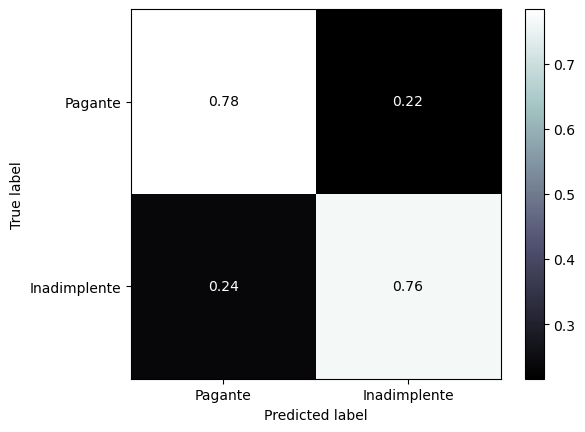

In [ ]:
# Fazer previsões para o conjunto de teste
y_pred = (model.predict_proba(X_test_processed)[:,1] > threshold).astype('int')

# Plotar a matriz de confusão normalizada para o conjunto de teste
print(classification_report_imbalanced(y_test, y_pred))
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, cmap='bone', display_labels=['Pagante','Inadimplente'], normalize='true')
plt.grid(False)

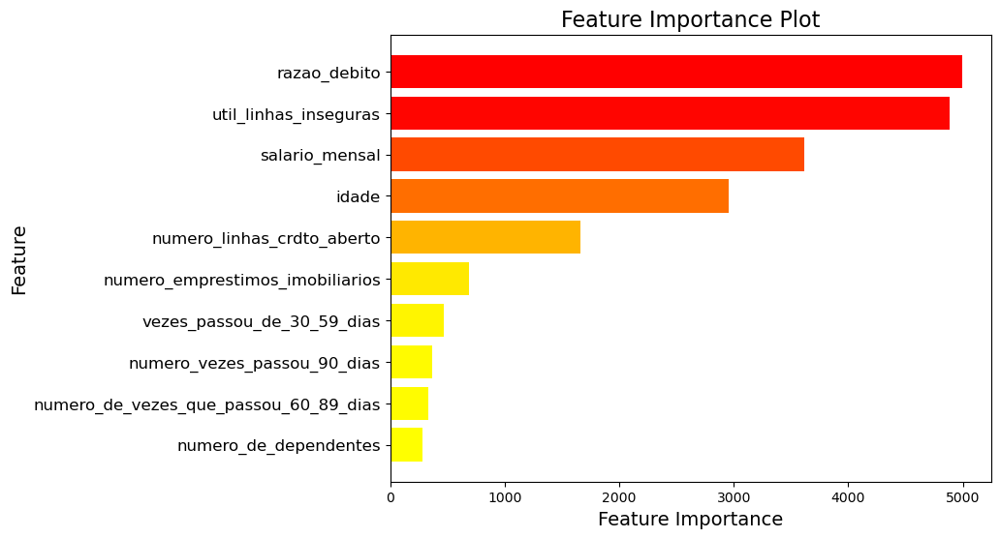

In [ ]:
import xgboost as xgb
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

def plot_feature_importance(model, feature_names, max_num_features=None):
    importance = model.get_booster().get_score(importance_type='weight')
    tuples = [(k, importance[k]) for k in importance]
    tuples = sorted(tuples, key=lambda x: x[1], reverse=False)

    if max_num_features:
        tuples = tuples[:max_num_features]

    sorted_names = [t[0] for t in tuples]
    sorted_scores = [t[1] for t in tuples]

    # Create a color map for the bars
    cmap = mcolors.LinearSegmentedColormap.from_list('mycmap', ['yellow', 'red'])

    # Scale the scores to [0, 1] and map them to the color map
    norm = mcolors.Normalize(vmin=min(sorted_scores), vmax=max(sorted_scores))
    colors = [cmap(norm(score)) for score in sorted_scores]

    # Plot the bars horizontally
    plt.figure(figsize=(8, 6))
    plt.barh(range(len(sorted_scores)), sorted_scores, color=colors)
    plt.yticks(range(len(sorted_names)), sorted_names, fontsize=12)
    plt.xlabel("Feature Importance", fontsize=14)
    plt.ylabel("Feature", fontsize=14)
    plt.title("Feature Importance Plot", fontsize=16)
    plt.show()

plot_feature_importance(model, list(X_train_processed))

In [ ]:
import shap
import numpy as np
from sklearn.model_selection import StratifiedShuffleSplit

# Assume X_full_train_processed and y_train are your input features and labels
# Use stratified sampling to obtain a 500-sample subset of the data
sss = StratifiedShuffleSplit(n_splits=1, train_size=500, random_state=0)
train_idx, _ = next(sss.split(X_full_train_processed, y_full_train))
X_full_train_processed_sampled = X_full_train_processed.iloc[train_idx,:]
y_full_train_sampled = y_full_train.iloc[train_idx]

# Create the explainer and compute SHAP values as usual
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_full_train_processed_sampled)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


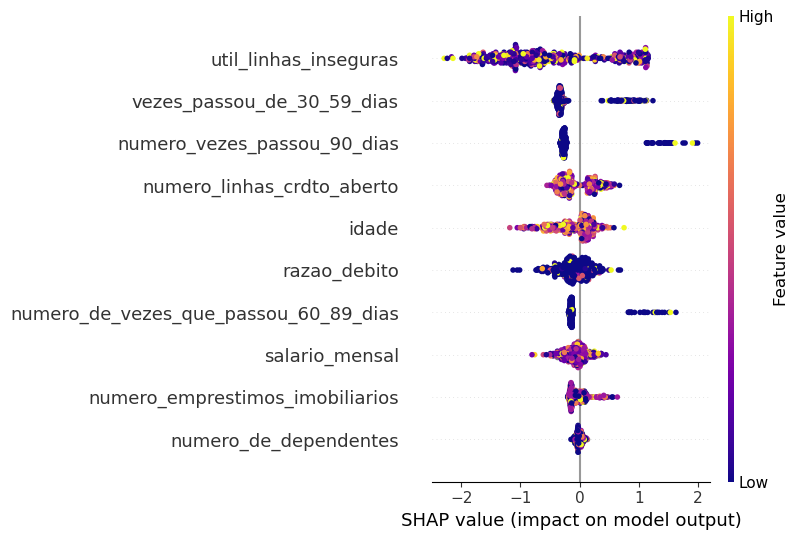

In [ ]:
shap.summary_plot(shap_values, X_full_train_processed_sampled, show=False, cmap='plasma')

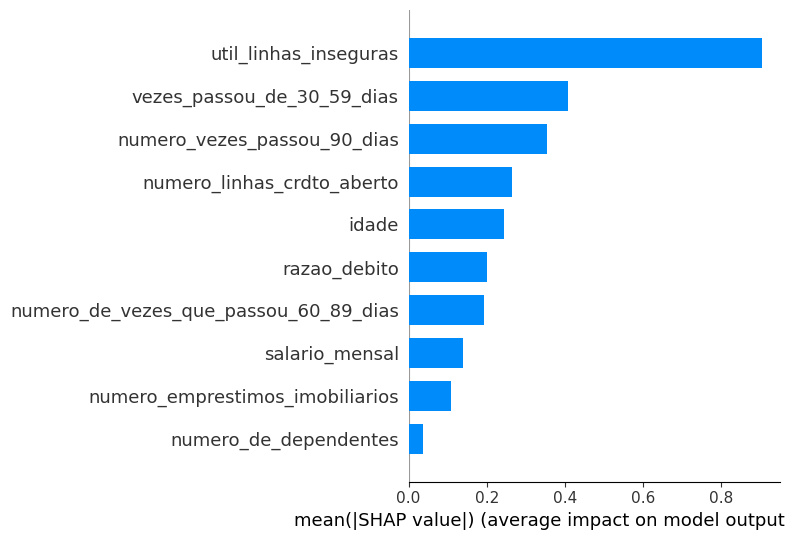

In [ ]:
shap.summary_plot(shap_values, X_full_train_processed_sampled, plot_type='bar')

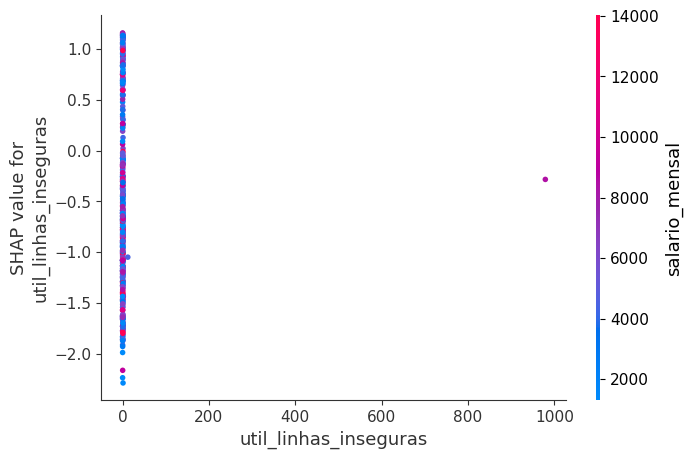

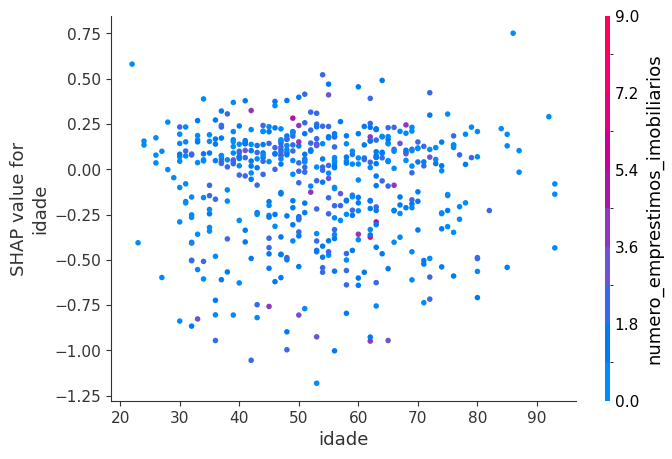

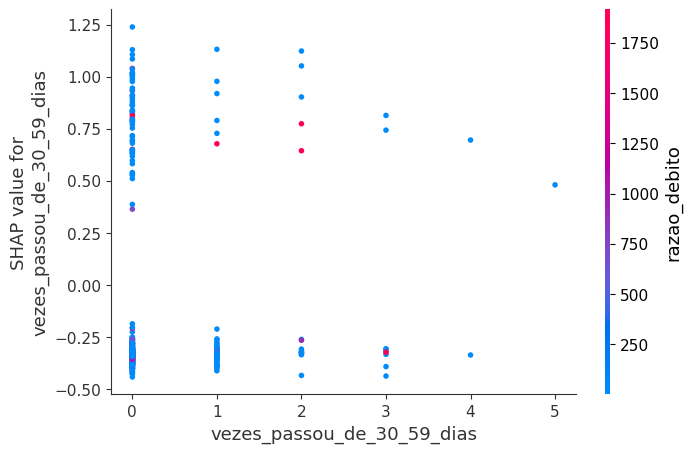

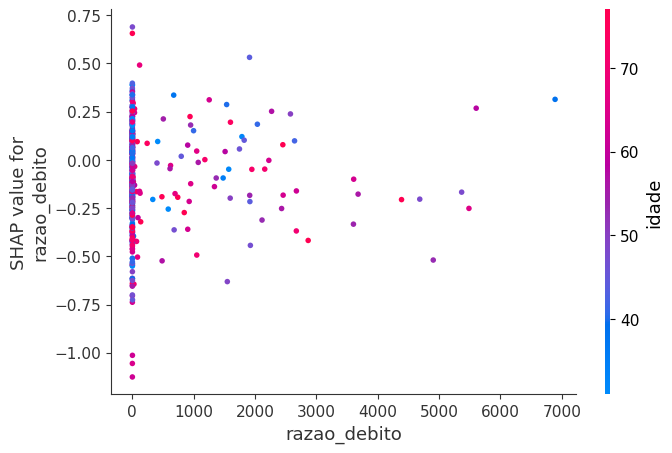

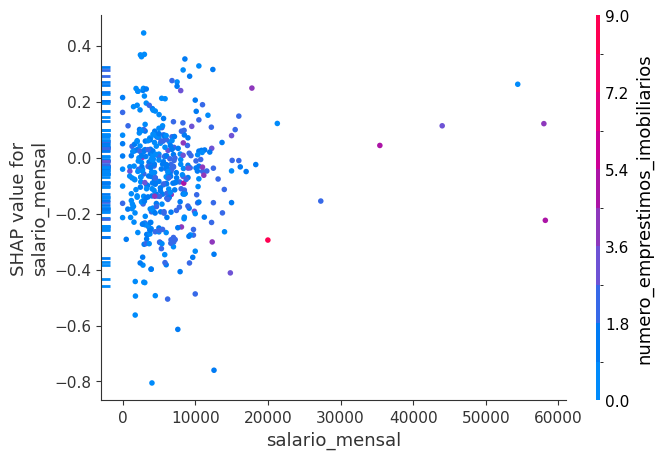

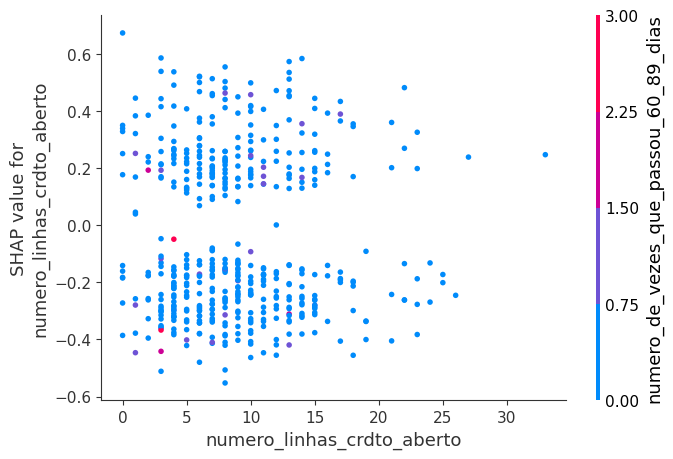

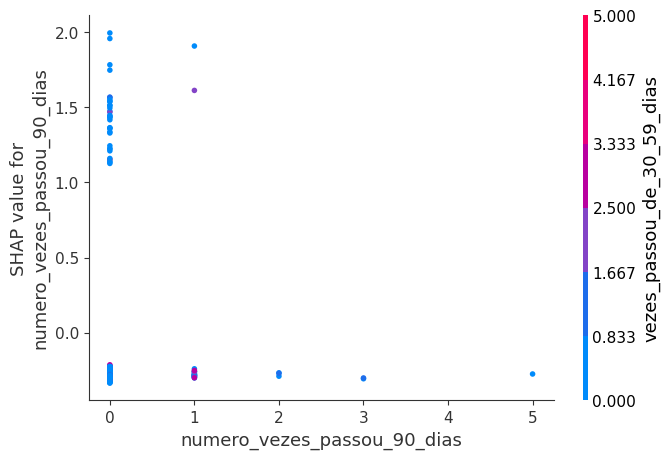

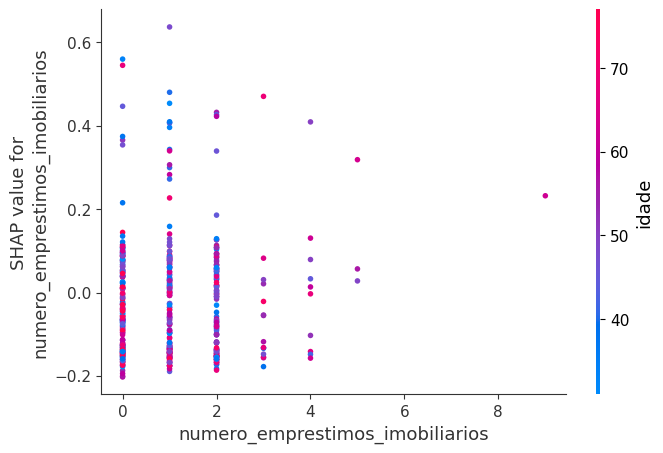

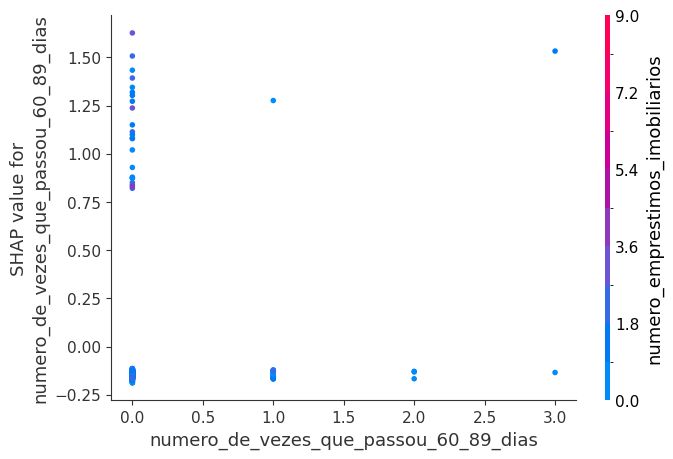

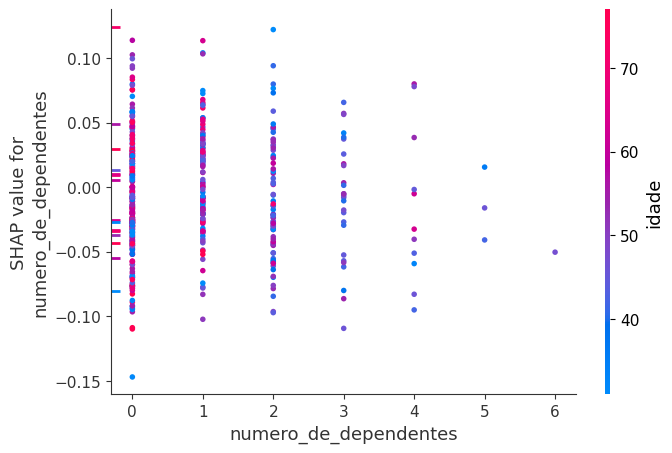

In [ ]:
for name in X_train.columns:
    shap.dependence_plot(name, shap_values, X_full_train_processed_sampled)

Os desempenhos dos modelos foram equivalentes em todas as métricas utilizadas Assim, é possível afirmar que convergiram para o mesmo mínimo local.

A interpretação dos gráficos SHAP, por outro lado, algumas diferenças. Por esse motivo, uma etapa adicional será a de construir um modelo Ensamble que combina as previsões dos dois modelos no âmbito de obter uma maior capacidade de generalização com o modelo final.

Para isso, será utiliza um modelo VotingClassifier, que simplesmente tira a média das probabilidades de cada modelo para compor a previsão final.

5.2.3 Stacking

In [ ]:
from sklearn.ensemble import VotingClassifier

# Definir os modelos base
xgb = XGBClassifier(**xgb_best_params,  scale_pos_weight = sample_weight)
lgbm = LGBMClassifier(**lgmb_best_params, is_unbalance=True)

# Criar o modelo ensemble
ensemble_model = VotingClassifier(estimators=[('lgbm', lgbm), ('xgb', xgb)], voting='soft')

# Treinar o modelo ensemble nos dados de treinamento
ensemble_model.fit(X_full_train_processed, y_full_train)

# Fazer previsões nos dados de teste
y_ensemble_pred = ensemble_model.predict(X_test_processed)
y_ensemble_pred_proba = ensemble_model.predict_proba(X_test_processed)[:,1]

                   pre       rec       spe        f1       geo       iba       sup

          0       0.98      0.80      0.75      0.88      0.77      0.60     20534
          1       0.21      0.75      0.80      0.33      0.77      0.59      1466

avg / total       0.93      0.79      0.75      0.84      0.77      0.60     22000

ROC AUC: 0.8537946946142364
PR AUC: 0.3677757366729484


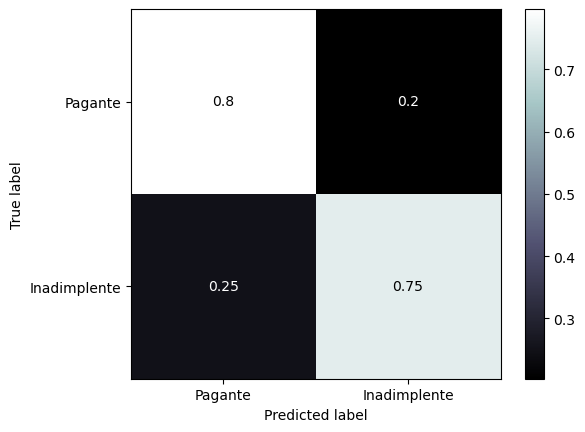

In [ ]:
# Plotar a matriz de confusão normalizada para o conjunto de teste
print(classification_report_imbalanced(y_test, y_ensemble_pred))
print('ROC AUC:', roc_auc_score(y_test, y_ensemble_pred_proba))
print('PR AUC:', average_precision_score(y_test, y_ensemble_pred_proba))
ConfusionMatrixDisplay.from_predictions(y_test, y_ensemble_pred, cmap='bone', display_labels=['Pagante','Inadimplente'], normalize='true')
plt.grid(False)

### 5.3 Escolha do modelo final 

In [ ]:
# Criando uma instância da classe Preprocessor que definimos anteriormente
preprocessor = Preprocessor()

# Aplicando o pré-processamento aos dados de treino usando o método fit_transform da instância preprocessor
X_train_processed = preprocessor.fit_transform(X_train)

# Aplicando o pré-processamento aos dados de teste usando o método transform da instância preprocessor
X_test_processed = preprocessor.transform(X_test)

# Calculando o peso da amostra (sample_weight) para ser usado em um modelo de aprendizado de máquina. A fórmula usada aqui é a razão entre o número de exemplos negativos e o número de exemplos positivos no conjunto de treino.
sample_weight = (y_train == 0).sum() / (y_train == 1).sum()

In [ ]:
# Dicionário de modelos com nomes correspondentes
modelos = {'xgb': xgb, 'lgbm': lgbm, 'proba_stacking': ensemble_model}

# Treinamento de cada modelo com os dados processados de treinamento
for nome, modelo in modelos.items():
    modelos[nome] = modelos[nome].fit(X_train_processed, y_train)

[LightGBM] [Warning] feature_fraction is set=0.5222801755875944, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5222801755875944
[LightGBM] [Warning] lambda_l1 is set=9.926392108265324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.926392108265324
[LightGBM] [Warning] bagging_fraction is set=0.8717240432571849, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8717240432571849
[LightGBM] [Warning] lambda_l2 is set=5.35701507396831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.35701507396831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.


[LightGBM] [Warning] feature_fraction is set=0.5222801755875944, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5222801755875944
[LightGBM] [Warning] lambda_l1 is set=9.926392108265324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.926392108265324
[LightGBM] [Warning] bagging_fraction is set=0.8717240432571849, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8717240432571849
[LightGBM] [Warning] lambda_l2 is set=5.35701507396831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.35701507396831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.


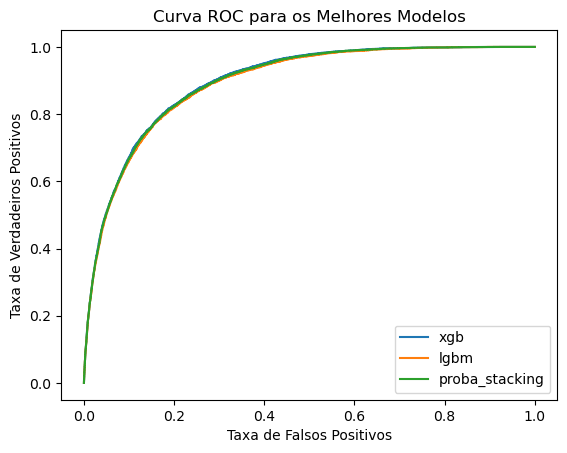

In [ ]:
# Criar uma figura e eixos para o gráfico
fig, ax = plt.subplots()

# Percorrer o dicionário best_models e plotar as curvas ROC
for name, model in modelos.items():
    plot_roc_curve(model.fit(X_train_processed, y_train), X_train_processed, y_train, ax=ax, label=name)

# Definir o título, rótulos dos eixos x e y
ax.set_title('Curva ROC para os Melhores Modelos')
ax.set_xlabel('Taxa de Falsos Positivos')
ax.set_ylabel('Taxa de Verdadeiros Positivos')

# Adicionar uma legenda ao gráfico
ax.legend()

# Exibir o gráfico
plt.show()

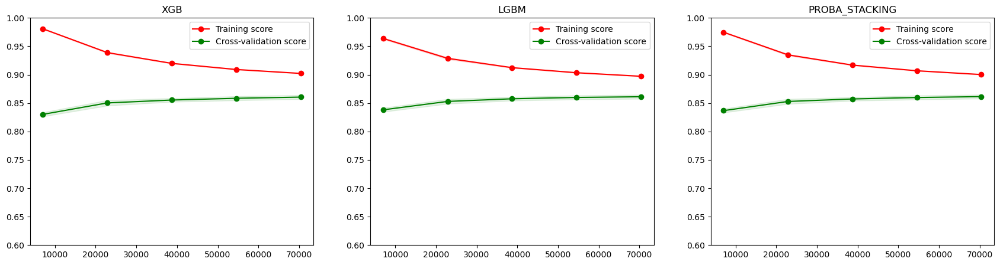

In [ ]:
# Define uma função que plota múltiplas curvas de aprendizado para diferentes modelos de machine learning
def plot_multiple_learning_curves(models, X, y, train_sizes=np.linspace(.1, 1.0, 5)):
    # Cria uma figura com subplots para cada modelo
    fig, axes = plt.subplots(1, len(models), figsize=(len(models)*7, 5))

    for i, model in enumerate(models.keys()):
        # Cria uma curva de aprendizado para o modelo atual
        train_sizes, train_scores, test_scores = learning_curve(
            models[model], X, y, cv=StratifiedKFold(), n_jobs=-1, train_sizes=train_sizes, scoring='roc_auc')

        # Calcula as médias e desvios padrão dos scores de treino e validação para cada tamanho de conjunto de treinamento
        train_scores_mean = np.mean(train_scores, axis=1)
        train_scores_std = np.std(train_scores, axis=1)
        test_scores_mean = np.mean(test_scores, axis=1)
        test_scores_std = np.std(test_scores, axis=1)

        # Preenche a área entre as barras de erro das curvas de treino e validação com cores diferentes
        axes[i].grid()
        axes[i].fill_between(train_sizes, train_scores_mean - train_scores_std,
                             train_scores_mean + train_scores_std, alpha=0.1,
                             color="r")
        axes[i].fill_between(train_sizes, test_scores_mean - test_scores_std,
                             test_scores_mean + test_scores_std, alpha=0.1, color="g")
        # Plota as curvas de treino e validação
        axes[i].plot(train_sizes, train_scores_mean, 'o-', color="r",
                     label="Training score")
        axes[i].plot(train_sizes, test_scores_mean, 'o-', color="g",
                     label="Cross-validation score")
        # Adiciona legenda, título e configurações adicionais para cada subplot
        axes[i].legend(loc="best")
        axes[i].set_title(f"{model.upper()}")
        axes[i].set_ylim(0.6, 1)
        axes[i].grid()
        
    # Mostra o gráfico final
    plt.show()

# Chama a função para plotar curvas de aprendizado para os modelos finais, usando o conjunto de treinamento completo
plot_multiple_learning_curves(modelos, X_train_processed, y_train)

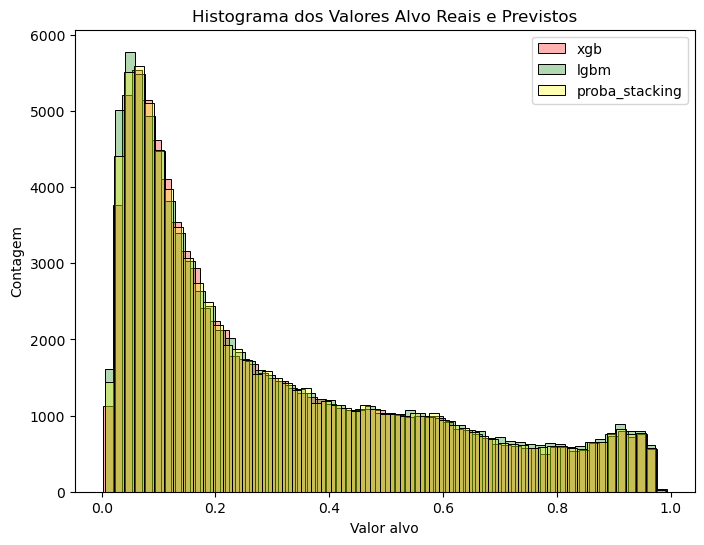

In [ ]:
def plotar_histogramas_predicao(models, X_test):
    # Configurar a figura
    fig, ax = plt.subplots(figsize=(8, 6))
    colors = ['red', 'green', 'yellow']

    # Plotar os valores previstos
    for i, model in enumerate(models.values()):
        y_pred = model.predict_proba(X_test)[:, 1]
        sns.histplot(y_pred, color=colors[i], alpha=0.3, ax=ax)

    # Adicionar uma legenda
    ax.legend(models.keys())

    # Adicionar rótulos dos eixos e um título
    ax.set_xlabel('Valor alvo')
    ax.set_ylabel('Contagem')
    ax.set_title('Histograma dos Valores Alvo Reais e Previstos')

    # Mostrar o gráfico
    plt.show()

plotar_histogramas_predicao(modelos, X_train_processed)


In [ ]:
def avaliar_modelos(y_true, y_preds, nomes_modelos):
    # Calcular ROC AUC e PR AUC para cada modelo
    roc_auc_scores = [roc_auc_score(y_true, y_pred) for y_pred in y_preds]
    pr_auc_scores = [average_precision_score(y_true, y_pred) for y_pred in y_preds]

    # Calcular métricas de classificação usando classification_report_imbalanced
    cr_metrics = [classification_report_imbalanced(y_true, y_pred, output_dict=True) for y_pred in y_preds]
    
    # Organizar os dados em um dicionário
    data = {}
    for i, cr in enumerate(cr_metrics):
        data[nomes_modelos[i]] = {}
        for label, metrics in cr.items():
            if label in [0,1]:
                for metric, value in cr[label].items():
                    data[nomes_modelos[i]][f'{metric}_{label}'] = value
            else:
                data[nomes_modelos[i]][label] = metrics
        data[nomes_modelos[i]]['roc_auc'] = roc_auc_scores[i]
        data[nomes_modelos[i]]['pr_auc'] = pr_auc_scores[i]
        
    # Retornar um DataFrame com as métricas de classificação, excluindo algumas colunas
    return pd.DataFrame(data).drop(['total_support','sup_0','sup_1'], axis=0).style.highlight_max(axis=1)

In [ ]:
# Fazer previsões usando os modelos e avaliá-los
lgbm_preds = modelos['lgbm'].predict(X_test_processed)
xgb_preds = modelos['xgb'].predict(X_test_processed)
ensemble_preds = modelos['proba_stacking'].predict(X_test_processed)
avaliar_modelos(y_test, [lgbm_preds, xgb_preds, ensemble_preds], list(modelos.keys()))

,xgb,lgbm,proba_stacking
pre_0,0.979904,0.979631,0.979790
rec_0,0.797896,0.803351,0.800380
spe_0,0.770805,0.766030,0.768759
f1_0,0.879583,0.882776,0.881044
geo_0,0.784234,0.784468,0.784410
iba_0,0.616688,0.617687,0.617244
pre_1,0.214015,0.217593,0.215653
rec_1,0.770805,0.766030,0.768759
spe_1,0.797896,0.803351,0.800380
f1_1,0.335013,0.338917,0.336820


Apesar de todos os desempenhos serem basimente os mesmos, nota-se que o LightGBM supera os demais em quase todas as métricas.

Dessa forma, ele será utilizado para fazer a previsão com o limiar de decisão definido pelo método GHOST (Generalized tHreshOld ShifTing Procedure), que faz uma busca exaustiva por uma lista de limiares de decisão e encontra aquele que otimiza um métrica de sua escolha. No caso, a métrica utilizada foi a escolha do limiar de decissão cujo ponto da curva é o mais próximo do canto superior direito. 

In [ ]:
# Usando o método GHOST de escolha do limiar de decisão
train_probs = modelos['lgbm'].predict_proba(X_full_train_processed)[:,1]
thresholds = np.round(np.arange(0.01, 0.99, 0.01),2)
threshold = ghostml.optimize_threshold_from_predictions(y_full_train, train_probs, thresholds, ThOpt_metrics = 'ROC') 
print(threshold)

0.48


                   pre       rec       spe        f1       geo       iba       sup

          0       0.98      0.78      0.79      0.87      0.79      0.62     20534
          1       0.21      0.79      0.78      0.33      0.79      0.62      1466

avg / total       0.93      0.78      0.79      0.84      0.79      0.62     22000



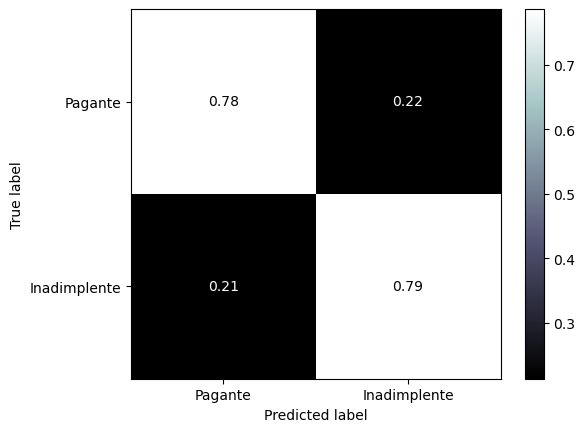

In [ ]:
# Fazer previsões para o conjunto de teste
y_pred = (modelos['lgbm'].predict_proba(X_test_processed)[:,1] > threshold).astype('int')

# Plotar a matriz de confusão normalizada para o conjunto de teste
print(classification_report_imbalanced(y_test, y_pred))
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, cmap='bone', display_labels=['Pagante','Inadimplente'], normalize='true')
plt.grid(False)

### 5.2 Classificação do conjunto de dados de teste pelo modelo escolhido

In [ ]:
# Copia os dados de treino e teste para um novo conjunto de dados
X_train_final = treino.copy().drop('inadimplente', axis=1)
y_train_final = treino['inadimplente'].copy()
X_test_final = teste.copy()

# Pré-processamento dos dados
preprocessador = Preprocessor()
X_train_final_processado = preprocessador.fit_transform(X_train_final)
X_test_final_processado = preprocessador.transform(X_test_final)

# Treina o modelo final com os dados de treino pré-processados e os pesos calculados
modelo_final = modelos['lgbm']
modelo_final.set_params(is_unbalance=True)
modelo_final.fit(X_train_final_processado, y_train_final)

# Realiza as previsões com o modelo treinado
y_pred_sub = (modelo_final.predict_proba(X_test_final_processado)[:,1] > threshold).astype('int')

# Adiciona as previsões ao conjunto de dados de teste e salva em um arquivo csv
X_test_submissao = X_test_final.copy()
X_test_submissao['inadimplente'] = y_pred_sub
X_test_submissao.to_csv('submissao.csv', index=0)

NameError: name 'treino' is not defined

## 6. Conclusão
- Resumo das descobertas
- Limitações e áreas para trabalhos futuros
- Conclusão


## 7. Referências

Algoritmos de Machine Learning:

- LightGBM: https://github.com/microsoft/LightGBM, https://lightgbm.readthedocs.io/en/latest/
- XGBoost: https://github.com/dmlc/xgboost, https://xgboost.readthedocs.io/en/latest/
- Adaboost: https://scikit-learn.org/stable/modules/ensemble.html#adaboost

Técnicas de amostragem de dados:

- NearMiss: https://imbalanced-learn.org/stable/under_sampling.html#controlled-under-sampling
- SMOTE: https://imbalanced-learn.org/stable/over_sampling.html#smote-variants
- SMOTEENN: https://imbalanced-learn.org/stable/combine.html#smote-variants

Ferramentas de Otimização de Hiperparâmetros:

- Optuna: https://github.com/optuna/optuna, https://optuna.readthedocs.io/en/stable/
- TPE Sampler: https://optuna.readthedocs.io/en/stable/reference/generated/optuna.samplers.TPESampler.html
- GHOST (Generalized tHreshOld ShifTing Procedure): https://github.com/rinikerlab/GHOST

Técnicas de Imputação de Dados:

- KNN Imputer: https://scikit-learn.org/stable/modules/generated/sklearn.impute.KNNImputer.html

Transformadores de Dados:

- Yeo-Johnson Transformer: https://feature-engine.readthedocs.io/en/latest/transformers/yj_transformer.html
- Winsorizer: https://feature-engine.readthedocs.io/en/latest/transformers/Winsorizer.html
